##  Image Filtering and Object Identification

**Outline**


* **Question 1: Image Filtering** 
  * **Question 1.0: Warm Up** 
  * **Question 1.1: 1D Filters** 
  * **Question 1.2: 2D Filters** 

* **Question 2: Multi-Scale Image Representations** 
  * **Question 2.1: Prewitt Operator**
  * **Question 2.2: Canny Edge Detector and Template Matching**
  * **Question 2.3: Harris Corner Detector** 
  * **Question 2.4: Gaussian Pyramid and Aliasing** 
  * **Question 2.5: Multi-Scale Template Matching** 

* **Question 3: Object Identification** 
  * **Question 3.1: 3D Joint Color Histogram** 
  * **Question 3.2: Types of Histograms** 
  * **Question 3.3: Histogram Metrics** 
  * **Question 3.4: Image Retrieval** 
  * **Report** *(2 points)*

* **Question 4: Performance Evaluation** 
  * **Question 4.1: Performance Evaluation** 
  * **Question 4.2: Closest Neighbours** 
  * **Question 4.3: Retrieval Metrics** 
  * **Question 4.4: Analysis and Report** 



## Question 1: Image Filtering 

In [ ]:
%%capture
# Set to True the first time you run this file to install the required packages
install_packages = True
if install_packages:
    %pip install pandas pillow numpy scipy matplotlib opencv-python scikit-image scikit-learn gdown
import os
if not all(os.path.exists(folder) for folder in ['assets', 'model', 'query', 'images']):
    !gdown 1K0V9KkIBELbQbCEdntE_N-eOhP8rAOrA
    !unzip -o hw1_data.zip
    !rm hw1_data.zip

In [ ]:
## import packages
import numpy as np
import pandas as pd
from PIL import Image
from scipy.signal import convolve2d
import matplotlib.pyplot as plt
import math
from scipy.ndimage import convolve1d
from skimage.metrics import structural_similarity as ssim
from skimage.transform import resize
from typing import List, Tuple, Optional, Dict, Union

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    precision_score,
    recall_score,
    f1_score,
)
from sklearn.linear_model import LogisticRegression

plt.rcParams["figure.figsize"] = (20, 8)

In [ ]:
def rgb2gray(rgb: np.ndarray) -> np.ndarray:
    """
    Converts RGB images to grayscale.

    Args:
        rgb (np.ndarray): RGB image.

    Returns:
        gray (np.ndarray): Grayscale image.
    """
    r, g, b = rgb[:, :, 0], rgb[:, :, 1], rgb[:, :, 2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    return gray

def plot_pictures(
    imgs: List[np.ndarray],
    xlabels: List[str],
    nrows: int,
    ncols: int,
    show: bool = True,
    cmap: Union[str, List[str]] = "gray",
    vmin: Optional[float] = None,
    vmax: Optional[float] = None,
    same_scale: bool = False,
) -> List[plt.Axes]:
    """
    Plots images in a grid.

    Args:
        imgs (list[np.ndarray]): List of images.
        xlabels (list[str]): List of xlabels.
        nrows (int): Number of rows.
        ncols (int): Number of columns.
        show (bool): Whether to show the plot.
        cmap (Union[str, List[str]]): Color map.
        vmin (float): Minimum value.
        vmax (float): Maximum value.
        same_scale (bool): Whether to use the same scale for all images.

    Returns:
        axs (list[matplotlib.axes._subplots.AxesSubplot]): List of axes.
    """
    fig, axs = plt.subplots(nrows, ncols,
                            width_ratios=[img.shape[1] / img.shape[0] for img in imgs],
                            sharey=same_scale,
                            figsize=(ncols * 4, nrows * 4))
    axs = axs.flatten()

    for i, (img, ax) in enumerate(zip(imgs, axs)):
        if isinstance(cmap, list):
            current_cmap = cmap[i]
        else:
            current_cmap = cmap
        im = ax.imshow(img, cmap=current_cmap, vmin=vmin, vmax=vmax)


        ax.set_title(xlabels[i])
        ax.axis('off')
    plt.tight_layout()

    if show:
        plt.show()
    else:
        return axs

#### 1.0: Warm Up 

##### **Convolution**

The convolution is defined as $f[m,n]=I \ast g= \sum_{k,l} I[m-k,n-l]g[k,l]$ and is a linear operator, thus the following properties hold:
* *Homogeneity*: $T[aX]=aT[X]$
* *Additivity* : $T[X_1+X_2]=T[X_1]+T[X_2]$
* *Superposition*: $T[aX_1+bX_2]=aT[X_1]+bT[X_2]$

Prove mathematically the additivity of convolution.

-------------------------------------------------------

### Proof of the Additivity Property of Convolution

We want to prove the **additivity** property of convolution, which states:

$$
T[X_1 + X_2] = T[X_1] + T[X_2]
$$

The convolution operation is defined above as:

$$
f[m,n] = I \ast g = \sum_{k,l} I[m-k,n-l]g[k,l]
$$

Let’s think of $X_1$ and $X_2$ as two images, and let $g$ represent the filter or kernel used in the convolution. We want to prove that:

$$
T[X_1 + X_2] = T[X_1] + T[X_2]
$$

To prove this, we can divide the equations into two parts: the Left Part and the Right Part.

#### Left Part: $T[X_1 + X_2]$

We start with:

$$
T[X_1 + X_2] = (X_1 + X_2) \ast g
$$

Using the definition of convolution, this becomes:

$$
T[X_1 + X_2] = \sum_{k,l} (X_1 + X_2)[m-k,n-l] g[k,l]
$$

This can be expanded as:

$$
T[X_1 + X_2] = \sum_{k,l} (X_1[m-k,n-l] + X_2[m-k,n-l]) g[k,l]
$$

#### Right Part: $T[X_1] + T[X_2]$

In this part, we compute the convolutions individually:

$$
T[X_1] = X_1 \ast g = \sum_{k,l} X_1[m-k,n-l] g[k,l]
$$

$$
T[X_2] = X_2 \ast g = \sum_{k,l} X_2[m-k,n-l] g[k,l]
$$

Now we add them together:

$$
T[X_1] + T[X_2] = \sum_{k,l} X_1[m-k,n-l] g[k,l] + \sum_{k,l} X_2[m-k,n-l] g[k,l]
$$

Since sums are linear operations, we can combine them into one sum operation:

$$
T[X_1] + T[X_2] = \sum_{k,l} (X_1[m-k,n-l] + X_2[m-k,n-l]) g[k,l]
$$

#### Conclusion

We can easily observe that the Left Part and Right Part represent the same expression:

- **Left Part:**
  $$
  T[X_1 + X_2] = \sum_{k,l} (X_1[m-k,n-l] + X_2[m-k,n-l]) g[k,l]
  $$

- **Right Part:**
  $$
  T[X_1] + T[X_2] = \sum_{k,l} (X_1[m-k,n-l] + X_2[m-k,n-l]) g[k,l]
  $$

This means that:

$$
T[X_1 + X_2] = T[X_1] + T[X_2]
$$

Thus, we have proved the additivity property of convolution.

-------------------------------------------------------

**Exercise on convolutions**

Usually, to be consistent with the definition, we use zero padding: this practice consists of adding a border of zero-valued pixels all around the edges of the input image.
In our case, we will have

\begin{equation}
f[m,n] =
\begin{pmatrix}
0 & 0 & 0 & 0 & 0 \\
0 & 4 & 5 & 7 & 0 \\
0 & 7 & 3 & 1 & 0 \\
0 & 9 & 2 & 2 & 0 \\
0 & 0 & 0 & 0 & 0 \\
\end{pmatrix}
*\begin{pmatrix}
-1 & 0 & 1 \\
-1 & 0 & 1 \\
-1 & 0 & 1 \\
\end{pmatrix}
=\begin{pmatrix}
... & ... & ... \\
... & -10 & ... \\
... & ... & ... \\
\end{pmatrix}.
\end{equation}

Now, given the images $I_1 \in \mathbb{N}^{5 \times 5}$, $I_2 \in \mathbb{N}^{5 \times 5}$, and the kernel $g \in \mathbb{N}^{2 \times 2}$, apply the additivity property for one convolution operation: you should expect that $T[I_1 + I_2]$ and $T[I_1]$ + $T[I_2]$ get the same result.
Displaying explicitly the operations you performed, feel free to choose the coordinates to apply the convolution on as you like them.

\begin{equation}
    I_1 =
    \begin{pmatrix}
        0 & 0 & 0 & 0 & 0 \\
        0 & 3 & 3 & 5 & 0 \\
        0 & 2 & 7 & 0 & 0 \\
        0 & 0 & 2 & 3 & 0 \\
        0 & 0 & 0 & 0 & 0 \\
    \end{pmatrix}, \quad
    I_2 =
    \begin{pmatrix}
        0 & 0 & 0 & 0 & 0 \\
        0 & 3 & 5 & 3 & 0 \\
        0 & 1 & 0 & 5 & 0 \\
        0 & 2 & 6 & 8 & 0 \\
        0 & 0 & 0 & 0 & 0 \\
    \end{pmatrix}, \quad
    g =
    \begin{pmatrix}
        -1 & 1 \\
        -1 & 1 \\
    \end{pmatrix}
\end{equation}

-------------------------------------------------------

## Answer

Let's perform the convolution operation on the given images $I_1$ and $I_2$ with the kernel $g$ and prove the additivity property of convolution, which states that:

$$
T[X_1 + X_2] = T[X_1] + T[X_2]
$$

### Given Data :
- **Images**
\begin{equation}
    I_1 =
    \begin{pmatrix}
        0 & 0 & 0 & 0 & 0 \\
        0 & 3 & 3 & 5 & 0 \\
        0 & 2 & 7 & 0 & 0 \\
        0 & 0 & 2 & 3 & 0 \\
        0 & 0 & 0 & 0 & 0 \\
    \end{pmatrix} \quad
    I_2 =
    \begin{pmatrix}
        0 & 0 & 0 & 0 & 0 \\
        0 & 3 & 5 & 3 & 0 \\
        0 & 1 & 0 & 5 & 0 \\
        0 & 2 & 6 & 8 & 0 \\
        0 & 0 & 0 & 0 & 0 \\
    \end{pmatrix} \quad
\end{equation}

- **Kernel**

\begin{equation}
    g =
    \begin{pmatrix}
        -1 & 1 \\
        -1 & 1 \\
    \end{pmatrix}
\end{equation}

### 1) Lets calculate $I_1$ + $I_2$


\begin{equation}
I_1 + I_2 =
\begin{pmatrix}
0 & 0 & 0 & 0 & 0 \\
0 & 3 & 3 & 5 & 0 \\
0 & 2 & 7 & 0 & 0 \\
0 & 0 & 2 & 3 & 0 \\
0 & 0 & 0 & 0 & 0 \\
\end{pmatrix}
+
\begin{pmatrix}
0 & 0 & 0 & 0 & 0 \\
0 & 3 & 5 & 3 & 0 \\
0 & 1 & 0 & 5 & 0 \\
0 & 2 & 6 & 8 & 0 \\
0 & 0 & 0 & 0 & 0 \\
\end{pmatrix}
=
\begin{pmatrix}
0 & 0 & 0 & 0 & 0 \\
0 & 6 & 8 & 8 & 0 \\
0 & 3 & 7 & 5 & 0 \\
0 & 2 & 8 & 11 & 0 \\
0 & 0 & 0 & 0 & 0 \\
\end{pmatrix}
\end{equation}


### 2) Calculate $T[I_1 + I_2]$

Now we need to apply the convolution to  $I_1 + I_2$ using kernel $g$

- **Convolution Calculation**

Now we convolve $I_1 + I_2$ with $g$:


$$
T[I_1 + I_2] = \sum_{k,l} I_1[m-k,n-l] g[k,l]
$$

- **$T[I_1 + I_2]$** at **$(0,0)$:**

$$
\begin{aligned}
T[I_1 + I_2](0,0) &= (I_1 + I_2)[0,0] \cdot g[0,0] + (I_1 + I_2)[0,1] \cdot g[0,1] + (I_1 + I_2)[1,0] \cdot g[1,0] + (I_1 + I_2)[1,1] \cdot g[1,1] \\
&= 0 \cdot (-1) + 0 \cdot 1 + 0 \cdot (-1) + 6 \cdot 1 \\
&= 0 + 0 + 0 + 6 \\
&= 6
\end{aligned}
$$

- **$T[I_1 + I_2]$** at **$(4,4)$:**

$$
\begin{aligned}
T[I_1 + I_2](4,4) &= (I_1 + I_2)[3,3] \cdot g[0,0] + (I_1 + I_2)[3,4] \cdot g[0,1] + (I_1 + I_2)[4,3] \cdot g[1,0] + (I_1 + I_2)[4,4] \cdot g[1,1] \\
&= 11 \cdot (-1) + 0 \cdot 1 + 0 \cdot (-1) + 0 \cdot 1 \\
&= -11 + 0 + 0 + 0 \\
&= -11
\end{aligned}
$$


End of the convolutions operations  $T[I_1+ I_2]$ will look like this :


\begin{equation}
    T[I_1 + I_2] =
    \begin{pmatrix}
        6 & 2 & 0 & -8  \\
        9 & 6 & -2 & -13  \\
        5 & 10 & 1 & -16  \\
        2 & 6 & 3 & -11  \\
    \end{pmatrix}
\end{equation}


### 3)  Calculate  $T[I_1]$

Next, we apply the convolution to $I_1$ using the kernel  $g$.


- **Convolution Calculation**

Now we convolve $I_1$ with $g$:

$$
T[I_1] = \sum_{k,l} I_1[m-k,n-l] g[k,l]
$$



- **$T[I_1]$** at **$(0,0)$:**



$$
\begin{aligned}
T[I_1](0,0) &= I_1[0,0] \cdot g[0,0] + I_1[0,1] \cdot g[0,1] + I_1[1,0] \cdot g[1,0] + I_1[1,1] \cdot g[1,1] \\
&= 0 \cdot (-1) + 0 \cdot 1 + 0 \cdot (-1) + 3 \cdot 1 \\
&= 0 + 0 + 0 + 3 \\
&= 3
\end{aligned}
$$

- **$T[I_1]$** at **$(4,4)$**

$$
\begin{aligned}
T[I_1](4,4) &= I_1[3,3] \cdot g[0,0] + I_1[3,4] \cdot g[0,1] + I_1[4,3] \cdot g[1,0] + I_1[4,4] \cdot g[1,1] \\
&= 3 \cdot (-1) + 0 \cdot 1 + 0 \cdot (-1) + 0 \cdot 1 \\
&= -3 + 0 + 0 + 0 \\
&= -3
\end{aligned}
$$

End of the convolutions operations  $T[I_1]$ will look like this :


\begin{equation}
    T[I_1] =
    \begin{pmatrix}
        3 & 0 & 2 & -5  \\
        5 & 5 & -5 & -5  \\
        2 & 7 & -6 & -3  \\
        0 & 2 & 1 & -3  \\
    \end{pmatrix}
\end{equation}



### 4)  Calculate  $T[I_2]$

Next, we apply the convolution to $I_2$ using the kernel  $g$.


- **Convolution Calculation**

Now we convolve $I_2$ with $g$:

$$
T[I_2] = \sum_{k,l} I_1[m-k,n-l] g[k,l]
$$



- **$T[I_2]$** at **$(0,0)$:**



$$
\begin{aligned}
T[I_2](0,0) &= I_2[0,0] \cdot g[0,0] + I_2[0,1] \cdot g[0,1] + I_2[1,0] \cdot g[1,0] + I_2[1,1] \cdot g[1,1] \\
&= 0 \cdot (-1) + 0 \cdot 1 + 0 \cdot (-1) + 3 \cdot 1 \\
&= 0 + 0 + 0 + 3 \\
&= 3
\end{aligned}
$$

- **$T[I_2]$** at **$(4,4)$**

$$
\begin{aligned}
T[I_2](4,4) &= I_2[3,3] \cdot g[0,0] + I_2[3,4] \cdot g[0,1] + I_2[4,3] \cdot g[1,0] + I_2[4,4] \cdot g[1,1] \\
&= 8 \cdot (-1) + 0 \cdot 1 + 0 \cdot (-1) + 0 \cdot 1 \\
&= -8 + 0 + 0 + 0 \\
&= -8
\end{aligned}
$$

End of the convolutions operations  $T[I_2]$ will look like this :


\begin{equation}
    T[I_2]=
    \begin{pmatrix}
        3 & 2 & -2 & -3  \\
        4 & 1 & 3 & -8  \\
        3 & 3 & 7 & -13  \\
        2 & 4 & 2 & -8  \\
    \end{pmatrix}
\end{equation}


### 5)  Calculate $T[I_2]$ + $T[I_2]$


\begin{equation}
T[I_2] + T[I_2] =
\begin{pmatrix}
3 & 0 & 2 & -5  \\
5 & 5 & -5 & -5  \\
2 & 7 & -6 & -3  \\
0 & 2 & 1 & -3  \\
\end{pmatrix}
+
\begin{pmatrix}
3 & 2 & -2 & -3  \\
4 & 1 & 3 & -8  \\
3 & 3 & 7 & -13  \\
2 & 4 & 2 & -8  \\
\end{pmatrix}
=
\begin{pmatrix}
6 & 2 & 0 & -8  \\
9 & 6 & -2 & -13 \\
5 & 10 & 1 & -16  \\
2 & 6 & 3 & -11 \\
\end{pmatrix}
\end{equation}

## Conclusion

In conclusion we can observe that the result of both convolutions are same .
\begin{equation}
T[I_2] + T[I_2] =
\begin{pmatrix}
6 & 2 & 0 & -8  \\
9 & 6 & -2 & -13 \\
5 & 10 & 1 & -16  \\
2 & 6 & 3 & -11 \\
\end{pmatrix} =
T[I_1 + I_2] =
\begin{pmatrix}
6 & 2 & 0 & -8  \\
9 & 6 & -2 & -13  \\
5 & 10 & 1 & -16  \\
2 & 6 & 3 & -11  \\
\end{pmatrix}
\end{equation}

$T[I_2] + T[I_2] =T[I_1 + I_2] $


Thus, we have proved the additivity property of convolution by displaying it.

-------------------------------------------------------

### 1.1: 1D Filters 


##### **1.1.1: 1-D Gaussian Filter**

Implement a method which computes the values of a 1-D Gaussian $G_x$ for a given standard deviation $\sigma$ and filter size $k$.:
\begin{equation}
G(x)=\frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right)
\end{equation}

The method should return a vector $x$ of values on which the Gaussian filter is defined: integer values on the interval of integers in $\left[-\kappa,\kappa\right]$ where $2\kappa =$ `filter_size`.

With $\sigma=3$ and `filter_size=18` you should get the following output:

![](./images/1gauss.png)

In [ ]:
def gauss(sigma: float, filter_size: int) -> Tuple[np.ndarray, np.ndarray]:
    """
    Computes the Gaussian filter.

    Args:
        sigma (int): Standard deviation.
        filter_size (int): Size of the filter.

    Returns:
        Gx (np.ndarray): Gaussian filter.
        x (np.ndarray): Array of integer values.
    """
    size=filter_size//2  #range: -size to size
    x = np.arange(-size, size +1) #x values
    #Gaussian function
    Gx = (1 / (np.sqrt(2 * np.pi) * sigma)) * np.exp(- (x**2) / (2 * sigma**2))

    return Gx, x

--------------------------------------------

**Do not write below this line just run it**

--------------------------------------------

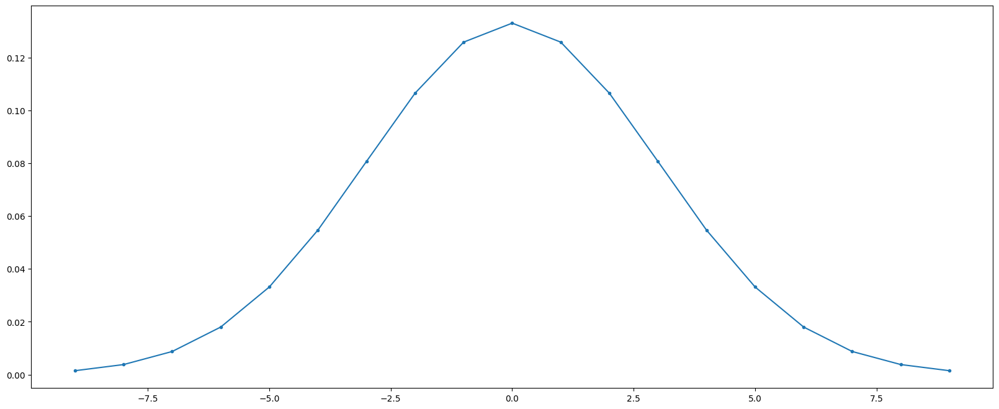

In [ ]:
sigma = 3
size = sigma * 6 + 1
Gx, x = gauss(sigma, size)
plt.figure(1)
plt.plot(x, Gx, ".-")
plt.show()

**Variation of $\sigma$ and filter size**

Now we generate a signal and apply the Gauss filter with different values of $\sigma$ and filter size.
Write down your considerations.

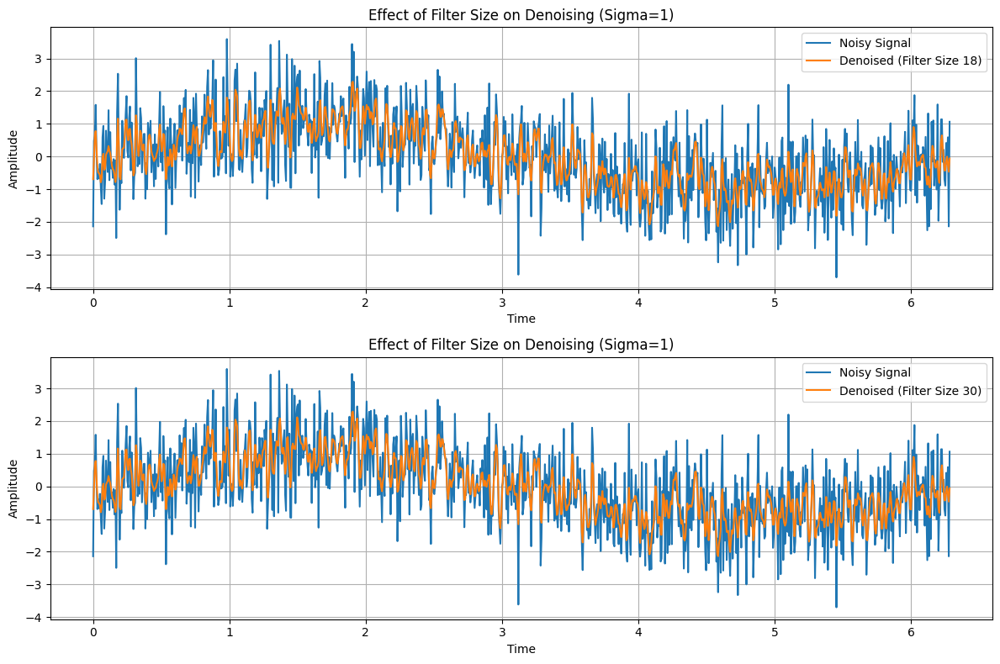

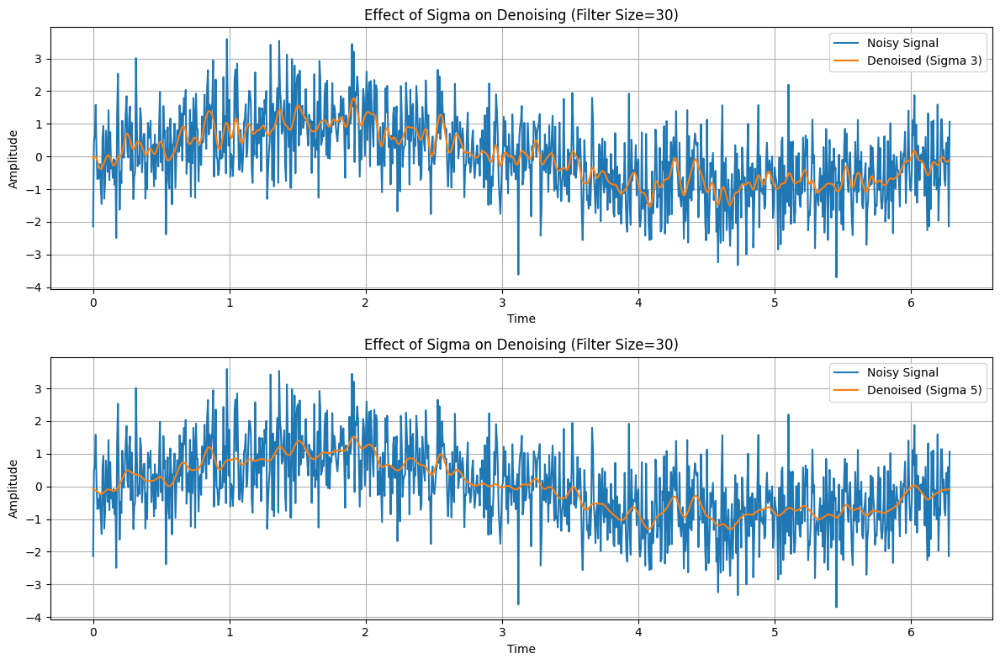

In [ ]:
# Generate a noisy signal with increased noise (example data)
t = np.linspace(0, 2 * np.pi, 1000)
noisy_signal = np.sin(t) + 1.0 * np.random.randn(len(t))  # Increased noise

# Define a fixed sigma value
sigma = 1

# Define a range of filter sizes to test
filter_sizes = [18, 30]

# Create subplots to compare the denoising results
plt.figure(figsize=(12, 8))

for i in range(len(filter_sizes)):
    # Get the Gaussian kernel and x values from the custom gauss function
    Gx, x = gauss(sigma, filter_sizes[i])

    # Convolve the noisy signal with the Gaussian filter
    denoised_signal = np.convolve(noisy_signal, Gx, mode="same")

    # Plot the noisy and denoised signals for the current filter_size
    plt.subplot(len(filter_sizes), 1, i + 1)
    plt.plot(t, noisy_signal, label="Noisy Signal")
    plt.plot(t, denoised_signal, label=f"Denoised (Filter Size {filter_sizes[i]})")
    plt.title(f"Effect of Filter Size on Denoising (Sigma={sigma})")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()


# Define a fixed sigma value
sigma = [3, 5]

# Define a range of filter sizes to test
filter_sizes = 30

# Create subplots to compare the denoising results
plt.figure(figsize=(12, 8))

for i in range(len(sigma)):
    # Get the Gaussian kernel and x values from the custom gauss function
    Gx, x = gauss(sigma[i], filter_sizes)
    denoised_signal = np.convolve(noisy_signal, Gx, mode="same")

    # Plot the noisy and denoised signals for the current filter_size
    plt.subplot(len(sigma), 1, i + 1)
    plt.plot(t, noisy_signal, label="Noisy Signal")
    plt.plot(t, denoised_signal, label=f"Denoised (Sigma {sigma[i]})")
    plt.title(f"Effect of Sigma on Denoising (Filter Size={filter_sizes})")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

-------------------------------------------------------


The effects of applying a Gaussian filter to a noisy signal, considering filter size and sigma value, are plotted above. Let's interpret them in pairs:

## 1) Filter Size

In this case we need to consider, the value of the sigma is fixed to 1

####  Filter Size = 18 :

From the first graph, we can observe that smaller filter sizes (18) have failed to sufficiently smooth the signal and have not been effective in reducing the noise. The reason for this is that when the filter size is reduced, the filtering process is performed over a narrower area. This means that each point in the signal is only considered in relation to a few neighboring points. As a result, this approach hinders the effective reduction of noise. Smaller filter sizes target only local fluctuations, which leads to a decrease in the denoising effect.

####  Filter Size = 30 :

As seen in the graph, increasing the filter size (30)  effects the reduction in the noise values of the signal. When the filter size increases, a broader neighborhood area is taken into account. Thus, the noise in the signal shows a better reduction compared to smaller filter sizes. However, very large filter sizes also increase the risk of losing details in the signal; therefore, it is important to establish a balance when selecting the filter size.


## 2) Sigma

In this case we need to consider, filter size is fixed to 30.

#### Sigma = 3 :

As we can see from the graphs, a small sigma value (3) provides less spread in the filtering process. As a result, has a lesser effect on reducing the noise in the signal. Although noise has decreased compared to the original signal, some fluctuations and small deviations in the signal are still evident. This limited effect is primarily due to the fact that a smaller sigma value results in a tighter Gaussian curve, meaning that only a narrow range of neighboring values contributes to each point in the signal.

#### Sigma = 5 :

I the other hand ,larger sigma value(5) results in a stronger denoising effect and it is  reducing noise while overall shape of the signal is preserved. However, this process may also cause certain details of the signal to be lost.Therefore, while a larger sigma value enhances the denoising effect, careful consideration must be given to ensure that essential signal features remain intac


-------------------------------------------------------

##### **1-D Box Filter**

Implement a method that computes the values of a 1-D Box $B_x$:
\begin{equation}
B= \left[\frac{1}{n},\frac{1}{n},\dots,\frac{1}{n}\right] \in \mathbb{R}^n
\end{equation}

The method should also return a vector $x$ of values on which the filter is defined: integer values in the interval $\left[-\kappa,\kappa\right]$ where $2\kappa =$ `filter_size`.

In [ ]:
def box(filter_size: int = 3) -> Tuple[np.ndarray, np.ndarray]:
    """
    Box filter.

    Args:
        filter_size (int): Filter size.

    Returns:
        Bx (np.ndarray): Box filter.
        x (np.ndarray): x values.
    """

    half_size= filter_size//2
    x = np.arange(-half_size, half_size+1 )
    Bx = np.full(filter_size, 1 / filter_size) #fills array with the same values


    return Bx, x

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

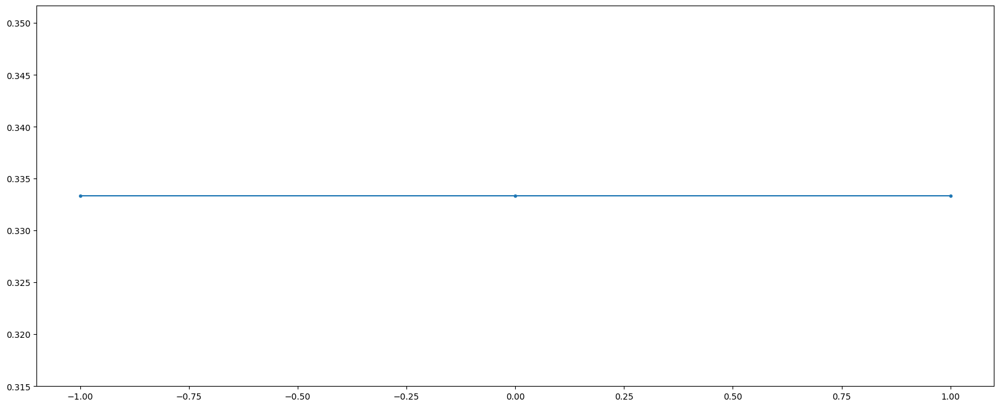

In [ ]:
## function box
size = 3
Bx, x = box(size)
plt.figure(1)
plt.plot(x, Bx, ".-")
plt.show()

##### **1.1.2: 1D Laplacian filter**

Derive the 1-D Laplacian of Gaussian $L_x$, then implement a method that computes it for a given standard deviation $\sigma$ and filter size $2k$. With $\sigma=3$ and $k=30$ you should expect the following output:

![](./images/1laplace.png)

-------------------------------------------------------


\begin{equation}
\frac{d^2G(x)}{dx^2}=
\end{equation}


### Given function:

\begin{equation}
G(x) = \frac{1}{\sqrt{2\pi}\sigma} \exp\left(-\frac{x^2}{2\sigma^2}\right)
\end{equation}

### First derivative:

To compute the first derivative of $G(x)$, we use the chain rule:

\begin{equation}
\frac{dG(x)}{dx} = -\frac{x}{\sigma^2} G(x)
\end{equation}

### Second derivative:

Now, we compute the second derivative $\frac{d^2G(x)}{dx^2}$ using the product rule:

\begin{equation}
\frac{d^2G(x)}{dx^2} = \frac{d}{dx} \left( -\frac{x}{\sigma^2} G(x) \right)
\end{equation}

Applying the product rule:

\begin{equation}
\frac{d^2G(x)}{dx^2} = -\frac{1}{\sigma^2} G(x) - \frac{x}{\sigma^2} \cdot \frac{dG(x)}{dx}
\end{equation}

Substitute $\frac{dG(x)}{dx} = -\frac{x}{\sigma^2} G(x)$:

\begin{equation}
\frac{d^2G(x)}{dx^2} = -\frac{1}{\sigma^2} G(x) + \frac{x^2}{\sigma^4} G(x)
\end{equation}

### Final result:

Thus, the second derivative is:

\begin{equation}
\frac{d^2G(x)}{dx^2} = -\frac{1}{\sigma^2} G(x) \left(1 - \frac{x^2}{\sigma^2}\right)
\end{equation}

-------------------------------------------------------

In [ ]:
def laplace(sigma: float, filter_size: int) -> Tuple[np.ndarray, np.ndarray]:
    """
    Laplace 1D filter.

    Args:
        sigma (int): Standard deviation.
        filter_size (int): Size of the filter.

    Returns:
        Lx (np.ndarray): Laplace filter.
        x (np.ndarray): x values.
    """

    size= filter_size//2
    x=np.arange(-size, size+1)
    #gaussian filter
    G_x = (1 / (np.sqrt(2 * np.pi) * sigma)) * np.exp(-x**2 / (2 * sigma**2))
    #first derivative of gaussian
    dG_dx = - (x / (sigma**2)) * G_x
    #Laplacian of gaussian
    Lx = - (1 / sigma**2) * (G_x * (1 - (x**2 / sigma**2)))
    return Lx, x

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

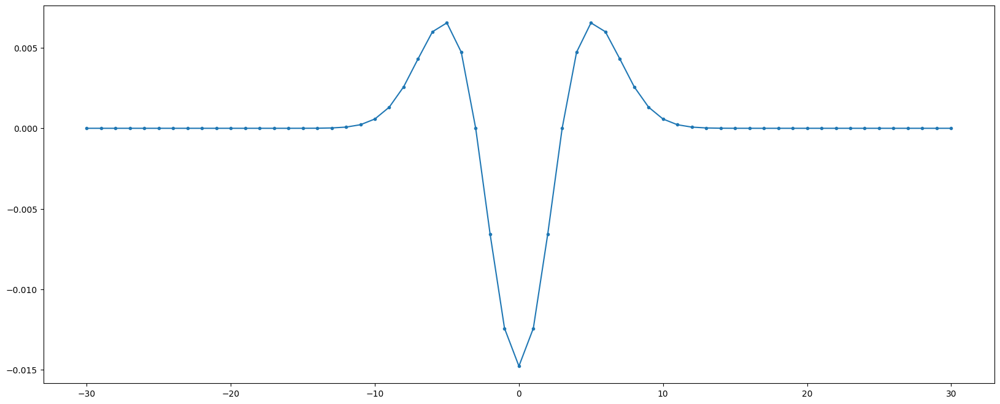

In [ ]:
sigma = 3
size = 61
Lx, x = laplace(sigma, size)
plt.figure(1)
plt.plot(x, Lx, ".-")
plt.show()

#### **1.1.3: An example of non-linear filter: 1-D median filter**

Up until now we have worked with linear 1-D filters, you are now asked to implement a non-linear one: the 1-D median filter.
At each position $p$ of a given 1-D signal $\mathcal{S}$, the median filter of size $s$ takes the neighborhood $\mathcal{N}_s(p)=[\mathcal{S}(p - \frac{s - 1}{2}), \mathcal{S}(p + \frac{s - 1}{2})]$, and replaces the value of $p$ with the median of the values in $\mathcal{N}_s(p)$.
Since it removes outliers from $\mathcal{N}_s(p)$, the median filter is often used in image and signal processing to remove noise.

Complete the method below to compute the median filter $m(\cdot)$ of size $s$ for all elements of a signal $\mathcal{S}$.
The method should return the filtered signal.
From the description above, you may have noticed that one must *carefully* consider how to deal with the boundaries of the signal.
In this exercise, you are free to choose the strategy to deal with the boundaries, you may look [here](https://en.wikipedia.org/wiki/Median_filter).

In [ ]:
def median_filter(signal: np.ndarray, filter_size: int) -> np.ndarray:
    """
    Median 1D filter.
    You are free to choose how to deal with the beginning and the end of the signal.
    You can use the `np.median` function https://numpy.org/doc/stable/reference/generated/numpy.median.html

    Args:
        signal (np.ndarray): 1-D array of values
        filter_size (int): size of the filter

    Returns:
        signal (np.ndarray): 1-D array of values with the median values computed at each position
    """
    n = len(signal)
    filtered_signal = np.zeros(n)

    half_size = filter_size // 2 #get neighborhood range


    for p in range(n):
        #get start index of the neighborhood (+ve)
        start_index = max(0, p - half_size)
        #get end index of the neighborhood (max is length of the signal)
        end_index = min(n, p + half_size + 1)

        #get the neighborhood of the current p in the signal
        neighborhood = signal[start_index:end_index]
        filtered_signal[p] = np.median(neighborhood)


    return filtered_signal

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

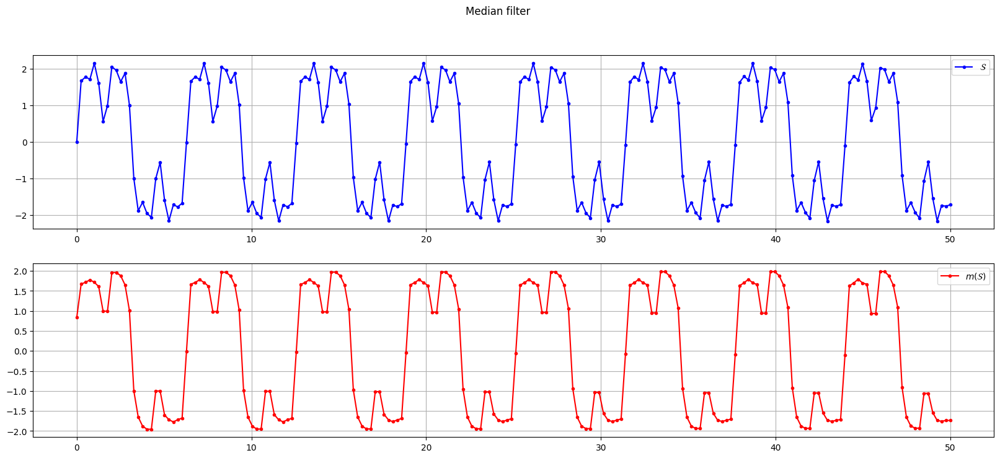

In [ ]:
filter_size = 3
signal = lambda x: 2 * np.sin(x) + np.sin(3 * x) + 0.5 * np.sin(7 * x)
x = np.linspace(0, 50, 200)
in_signal = signal(x)
out_signal = median_filter(in_signal.copy(), filter_size)
assert in_signal.shape == out_signal.shape
fig, axs = plt.subplots(2)
fig.suptitle("Median filter")
axs[0].plot(x, in_signal, ".-", label="$\\mathcal{S}$", color="blue")
axs[0].grid()
axs[0].legend()
axs[1].plot(x, out_signal, ".-", label="$m(\\mathcal{S})$", color="red")
axs[1].grid()
axs[1].legend()
plt.show()

#### **1.1.4: Check linearity of the filters**

In *Question 1.0: warmup* we have seen some of the properties of linear operators and we have proven the additivity property of convolution.
Consider the 1-D Gaussian filter $g(\cdot)$, the 1-D Laplacian filter $l(\cdot)$, and the 1-D median filter $m(\cdot)$.
You are given signals $\mathcal{S}_1$ and $\mathcal{S}_2$, by taking advantage of the functions you have implemented in the previous exercises, empirically verify the following:

1. $g(\mathcal{S}_1 + \mathcal{S}_2) = g(\mathcal{S}_1) + g(\mathcal{S}_2)$
2. $l(\mathcal{S}_1 + \mathcal{S}_2) = l(\mathcal{S}_1) + l(\mathcal{S}_2)$
3. $g(l(\mathcal{S}_1 + \mathcal{S}_2)) = (g * l) * \mathcal{S}_1 + (g * l) * \mathcal{S}_2$
4. $m(\mathcal{S}_1 + \mathcal{S}_2) \neq m(\mathcal{S}_1) + m(\mathcal{S}_2)$

*HINT: you can exploit the function `convolve1d` from `scipy.signal` to compute the convolution with the Gaussian and the Laplacian filters.*

In [ ]:
x = np.linspace(0, 50, 200)
s1 = 2 * np.sin(x) + np.sin(3 * x) + 0.5 * np.sin(7 * x)
s2 = 2 * np.cos(x) + np.cos(3 * x) + 0.5 * np.cos(7 * x)
sigma, filter_size = 1,7

from scipy.signal import convolve

g_s1_s2 = convolve(s1 + s2, Gx, mode='same')
g_s1_g_s2 = convolve(s1, Gx, mode='same') + convolve(s2, Gx, mode='same')
l_s1_s2 = convolve(s1 + s2, Lx, mode='same')
l_s1_l_s2 = convolve(s1, Lx, mode='same') + convolve(s2, Lx, mode='same')
g_l_s1_s2 = convolve(convolve(s1 + s2, Lx, mode='same'), Gx, mode='same')
g_l_s1_g_l_s2 = convolve(convolve(s1, Lx, mode='same'), Gx, mode='same') + convolve(convolve(s2, Lx, mode='same'), Gx, mode='same')
m_s1_s2 = median_filter(s1 + s2, filter_size)
m_s1_m_s2 = median_filter(s1, filter_size) + median_filter(s2, filter_size)

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [ ]:
assert np.allclose(g_s1_s2, g_s1_g_s2), "Equation (1) is not verified"
assert np.allclose(l_s1_s2, l_s1_l_s2), "Equation (2) is not verified"
assert np.allclose(g_l_s1_s2, g_l_s1_g_l_s2), "Equation (3) is not verified"
assert not np.allclose(m_s1_s2, m_s1_m_s2), "Equation (4) is not verified"

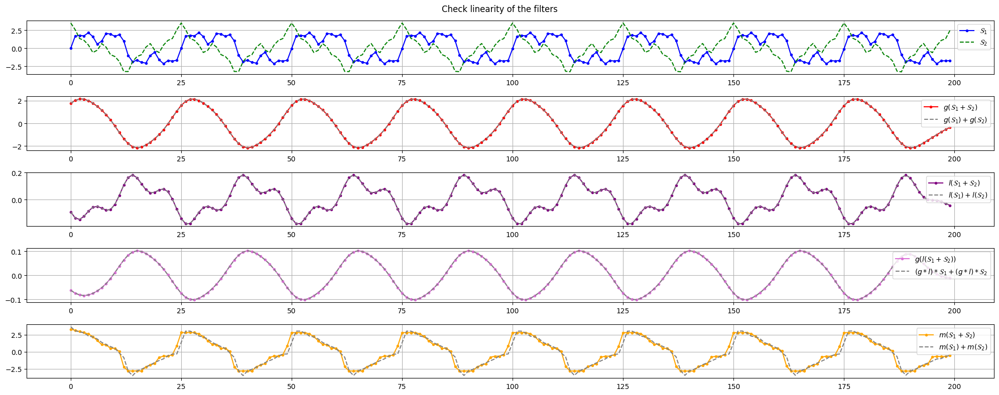

In [ ]:
fig, axs = plt.subplots(5, 1)
fig.suptitle("Check linearity of the filters")
ys = [s1, s2, g_s1_s2, g_s1_g_s2, l_s1_s2, l_s1_l_s2, g_l_s1_s2, g_l_s1_g_l_s2, m_s1_s2, m_s1_m_s2]
labels = ["$\\mathcal{S}_1$", "$\\mathcal{S}_2$", "$g(\\mathcal{S}_1 + \\mathcal{S}_2)$", "$g(\\mathcal{S}_1) + g(\\mathcal{S}_2)$", "$l(\\mathcal{S}_1 + \\mathcal{S}_2)$", "$l(\\mathcal{S}_1) + l(\\mathcal{S}_2)$", "$g(l(\\mathcal{S}_1 + \\mathcal{S}_2))$", "$(g * l) * \\mathcal{S}_1 + (g * l) * \\mathcal{S}_2$", "$m(\\mathcal{S}_1 + \\mathcal{S}_2)$", "$m(\\mathcal{S}_1) + m(\\mathcal{S}_2)$"]
colors = ["blue", "green", "red", "gray", "purple", "gray", "orchid", "gray", "orange", "gray"]
for y_idx in range(0, len(ys), 2):
    i = y_idx // 2
    x = np.arange(ys[y_idx].shape[0])
    axs[i].plot(x, ys[y_idx], ".-", label=labels[y_idx], color=colors[y_idx])
    axs[i].plot(x, ys[y_idx + 1], "--", label=labels[y_idx + 1], color=colors[y_idx + 1])
    axs[i].grid()
    axs[i].legend(loc="upper right")
fig.tight_layout()
plt.show()


**Why is that for the median filter $m(\mathcal{S}_1 + \mathcal{S}_2) \neq m(\mathcal{S}_1) + m(\mathcal{S}_2)$?**

-------------------------------------------------------

The median filter is a non-linear filter commonly used in image processing to reduce noise. For a given pixel value, the median filter replaces that pixel's value with the median value of the pixels in a neighborhood around it.

- **Non-linearity of the Median:** The median is a non-linear operation. This means that the median of a sum of two distributions does not equal the sum of the medians of the two distributions. This contrasts with linear operations, such as addition or averaging.

- **Different Distribution:** When you add the two sets, their combined distribution of values can be very different from the individual distributions. The presence of higher values in one set can significantly shift the median when combined with the other set.

-------------------------------------------------------

#### **1.1.5: Butterworth Filter**

The Butterworth filter is a type of frequency domain filter characterized by a smooth transition between passband and stopband.
    It is commonly used in signal processing to filter out frequencies beyond a certain cutoff, while maintaining a relatively flat frequency response in the passband.
    The sharpness of the cutoff is controlled by the order of the filter (n).

\begin{equation}
H(x) = \frac{1}{1 + \left( \frac{x}{\text{cutoff}} \right)^{2n}}
\end{equation}





With $\verb|cutoff|=20$ , $\verb|filtersize|=30$ and $n=2$ you shouls expect the following output:

![1dbutterworth](./images/Butterworth_Filter.png)

In [ ]:
def butterworth_filter_1d(cutoff: float, filter_size: int, n: int) -> Tuple[np.ndarray, np.ndarray]:
    """
    Implements a 1D Butterworth filter.

    Args:
        cutoff (float): The frequency cutoff point. Determines the transition point between passband and stopband.
        filter_size (int): Size of the filter. The filter will have `filter_size` elements symmetrically centered around zero.
        n (int): The order of the Butterworth filter. Higher values result in a sharper transition between passband and stopband.

    Returns:
        Hx (np.ndarray): The 1D Butterworth filter coefficients.
        x (np.ndarray): The x values corresponding to the filter, centered around zero.

    """
    half_size = filter_size // 2
    x = np.arange(-half_size, half_size+1)

    Hx = 1 / (1 + (x / cutoff)**(2 * n)) #butterflyworth filter function

    return Hx, x


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

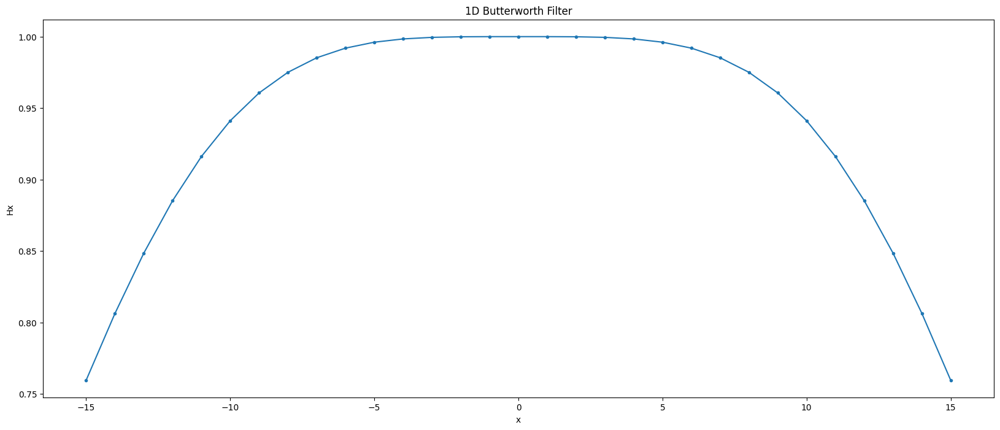

In [ ]:
cutoff = 20.0
filter_size = 30
n = 2

# Generate the Butterworth filter
Hx, x = butterworth_filter_1d(cutoff, filter_size, n)

# Plot the Butterworth filter
plt.figure(1)
plt.plot(x, Hx, ".-")
plt.title("1D Butterworth Filter")
plt.xlabel("x")
plt.ylabel("Hx")
plt.show()

### 1.2: 2D Filters 



##### **2-D Laplacian filter**

The function should take an image as input and return the result of the convolution of the image with a 2-D Laplacian kernel.
You can use Python’s `convolve2D` function if you don’t want to implement it yourself.

In [ ]:
def laplacefiltering2D(img: np.ndarray, sigma: float, filter_size: int = 3) -> np.ndarray:
    """
    Implement a 2D Laplacian filter.

    Args:
        img (np.ndarray): Input image.
        sigma (int): Standard deviation.
        filter_size (int): Filter size.

    Returns:
        smooth_img (np.ndarray): Smoothed image.
    """
    #odd filter size
    if filter_size % 2 == 0:
        filter_size += 1
    size=filter_size


    radius = filter_size // 2
    #meshgrid centered around 0
    x, y = np.meshgrid(np.arange(-radius, radius + 1), np.arange(-radius, radius + 1))

    #coefficients of the Laplacian of Gaussian kernel
    coeff = -1 / (np.pi * sigma**4)
    exponent = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    #laplacian filter
    log_kernel = coeff * (1 - (x**2 + y**2) / (2 * sigma**2)) * exponent

    #apply to the input img to smoothen img
    smooth_img = convolve2d(img, log_kernel, mode='same')


    return smooth_img

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

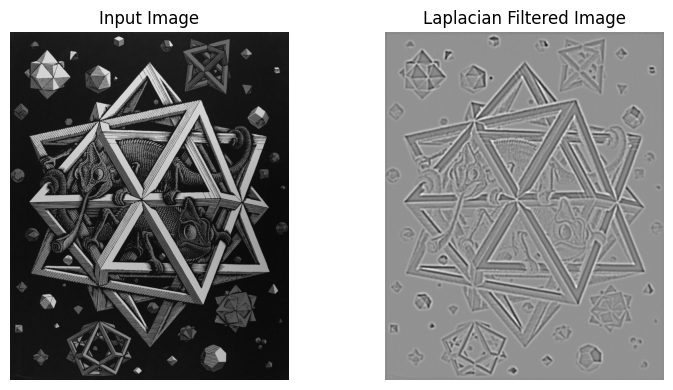

In [ ]:
img = rgb2gray(np.array(Image.open("./images/stella.jpg")))
smooth_img = laplacefiltering2D(img, 3, 18)

imgs = [img, smooth_img]
labels = ["Input Image", "Laplacian Filtered Image"]

plot_pictures(imgs, labels, nrows=1, ncols=2, cmap="gray", vmin=None, vmax=None)

##### **2-D Box filter**

The function should take an image as input and return the result of the convolution of this image with a 2D Box kernel.
Beware of errors in the following code, find them, and correct them.
You will be provided with the image to which the correct box filter has already been applied and you can use the SSIM metric to check that your result is correct, $SSIM \approx 1$ means that it is correct.

See the figure below for an illustration of Box filtering.

![](./images/box_image.jpg)

In [ ]:
def boxfiltering(img: np.ndarray, filter_size: int) -> np.ndarray:
    """
    Implement a 2D Box filter.

    Args:
        img (np.ndarray): Input image.
        filter_size (int): Filter size.

    Returns:
        smooth_img (np.ndarray): Smoothed image.

    """
    #initialize an array of ones and normalize by filter size to create the box filter
    box_kernel = np.ones((filter_size, filter_size)) / (filter_size ** 2)
    #convolve to apply the filter to the img
    smooth_img = convolve2d(img, box_kernel, mode='same', boundary='fill', fillvalue=0)

    return smooth_img

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

(1024, 821)


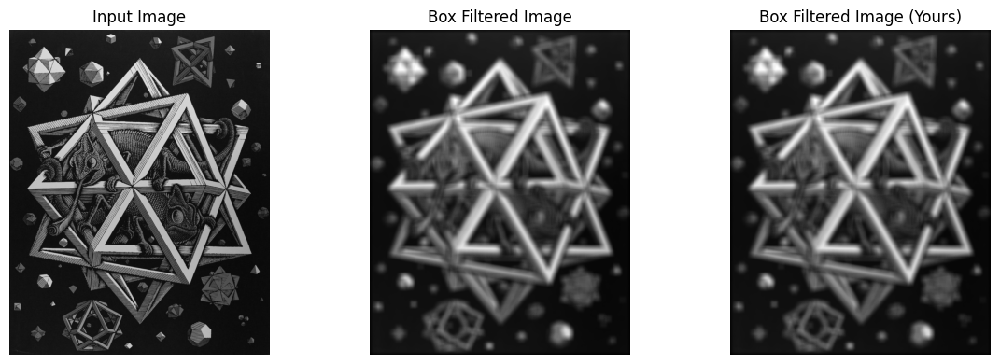

target_ssim_score:	1.0
your_ssim_score:	0.9999999999999889


In [ ]:
img = rgb2gray(np.array(Image.open("./images/stella.jpg")))
smooth_img = np.load("assets/box_filter.npy")
smooth_fooled = boxfiltering(img, 20)


imgs = [img, smooth_img, smooth_fooled]
labels = ["Input Image", "Box Filtered Image", "Box Filtered Image (Yours)"]

plot_pictures(imgs, labels, nrows=1, ncols=3, cmap="gray", vmin=None, vmax=None)

print(
    f"target_ssim_score:\t{ssim(smooth_img, smooth_img, data_range=smooth_img.max() - smooth_img.min())}\nyour_ssim_score:\t{ssim(smooth_img, smooth_fooled, data_range=smooth_img.max() - smooth_img.min())}"
)


##### **Separability and computational efficiency**

A separable filter is one that can be computed as $K(x,y) = f(x)f(y)$. Is the Laplacian of Gaussians filter separable?
Remember that the Laplacian filter is $\nabla^2 = \frac{\partial^2}{\partial x^2} + \frac{\partial^2}{\partial y^2}$.

-------------------------------------------------------


## Analytical Proof of Laplacian Filter Separability

The **Laplacian operator** in 2D is defined as:

$$
\nabla^2 = \frac{\partial^2}{\partial x^2} + \frac{\partial^2}{\partial y^2}
$$

It involves second-order partial derivatives with respect to $x$ and $y$, which means it sums the second derivatives in both directions independently.

###  Laplacian Operator in Discrete Form


In a discrete grid, the Laplacian can be approximated using finite differences. The commonly used 3x3 kernel for the Laplacian is:

$$
L = \begin{bmatrix}
0 & 1 & 0 \\
1 & -4 & 1 \\
0 & 1 & 0
\end{bmatrix}
$$

This kernel can be written as the sum of two 1D operators (one for the second derivative in the x-direction and one for the second derivative in the y-direction.

- The second derivative operator in the \(x\)-direction can be written as:

$$
L_x = \begin{bmatrix} 1 & -2 & 1 \end{bmatrix}
$$

- Similarly, the second derivative operator in the \(y\)-direction is:

$$
L_y = \begin{bmatrix} 1 \\ -2 \\ 1 \end{bmatrix}
$$

After that, We can express the 2D Laplacian filter as a combination of these 1D operators.

$$
L = L_x \otimes I + I \otimes L_y
$$

Note : where $I$ is the identity matrix.

In this case, $I = [1]$ for the 1D identity in the opposite direction. This means:

$$
L = \begin{bmatrix} 1 & -2 & 1 \end{bmatrix} \otimes \begin{bmatrix} 1 \end{bmatrix} + \begin{bmatrix} 1 \end{bmatrix} \otimes \begin{bmatrix} 1 \\ -2 \\ 1 \end{bmatrix}
$$

This results in the familiar 3x3 Laplacian kernel:

$$
L = \begin{bmatrix}
0 & 1 & 0 \\
1 & -4 & 1 \\
0 & 1 & 0
\end{bmatrix}
$$


#### Since the Laplacian operator is the sum of these two independent 1D operations, it is **separable**.

-------------------------------------------------------

Briefly explain why it is more convenient computationally speaking to use two 1D Laplacian filters rather than one 2D Laplacian filter.
Assume that the dimension of the 2D Laplacian filter is $k^2$ and that the dimension of the two 1D Laplacian filters is $k$.

-------------------------------------------------------

## Computational Efficiency: 2D vs. 1D Laplacian Filters

Using two 1D Laplacian filters instead of one 2D Laplacian filter is computationally more efficient due to the difference in the number of operations involved.

### 2D Laplacian Filter

For a **2D Laplacian filter** of size $ k \times k $, the number of operations required per pixel during convolution is $ k^2 $. For an image of size $ M \times N $, the total number of operations can be expressed as:

$$
O(M \times N \times k^2)
$$

### Two 1D Laplacian Filters

When using two **1D Laplacian filters**, each filter is of size $ k $. First, the 1D filter is applied along the rows, followed by another 1D filter along the columns. Each 1D convolution requires $k $ operations per pixel, so for both 1D filters, the total number of operations is:

$$
O(M \times N \times 2k)
$$

### Comparison of Complexity

- **2D Laplacian filter complexity**: $ O(M \times N \times k^2) $
- **Two 1D Laplacian filter complexity**: $ O(M \times N \times 2k) $

Thus, using separable 1D filters reduces the computational cost from $ O(M \times N \times k^2) $to $ O(M \times N \times 2k) $, which is significantly more efficient, particularly for larger kernel sizes.


-------------------------------------------------------

##### **Practical example of separability**

Up to this point, we have seen that both the Gaussian and the Laplacian operators are linear and you have explicitly proven that the Laplacian operator is separable.
As you may guess, the Gaussian operator is also separable, and so is the composition of them: the Laplacian of Gaussian (LoG) operator.
Recall from section section "2-D Laplacian filter" that the LoG operator is defined as:

\begin{equation}
\nabla^2 \circ G = \frac{d^2G(x)}{dx^2}=-\frac{\sigma^2 - x^2}{\sqrt{2\pi}\sigma^5}\exp\left(-\frac{x^2}{2\sigma^2}\right)
\end{equation}

Previously, you have implemented a 2-D LoG filter without leveraging the separability property.
In this section, you're asked to implement again the 2-D LoG filter **exploiting the separability**, i.e. convolving the image with a separable 1-D Laplacian kernel along axes.

Compare the images to check that the separability property is valid. Note that the last image shows the differences between the separable case and the non separable case: it should be black up to numerical approximations, i.e. it should cointain approximately 0 everywhere.

In [ ]:
def laplacefiltering(img: np.ndarray, sigma: float, filter_size: int = 18) -> np.ndarray:
    """
    Implement a 2D Laplacian filter, leveraging the previous laplacian and the separability property.

    Args:
        img (np.ndarray): Input image.
        sigma (int): Standard deviation.
        filter_size (int): Filter size.

    Returns:
        derived_img (np.ndarray): Derived image.
    """

    #filter size is odd
    if filter_size % 2 == 0:
        filter_size += 1
    size=filter_size

    radius = filter_size // 2
    x = np.arange(-radius, radius + 1)
    #gauss function
    gauss=(1 / (np.sqrt(2 * np.pi) * sigma)) * np.exp(- (x**2) / (2 * sigma**2))


    #1st derivative of gauss
    log_1d = - (1 / sigma**2) * (gauss * (1 - (x**2 / sigma**2)))

    #convolve in x direction and y direction
    img_x = convolve2d(img, log_1d[:, np.newaxis], mode='same')
    img_y = convolve2d(img_x, log_1d[np.newaxis, :], mode='same')

    return img_x

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

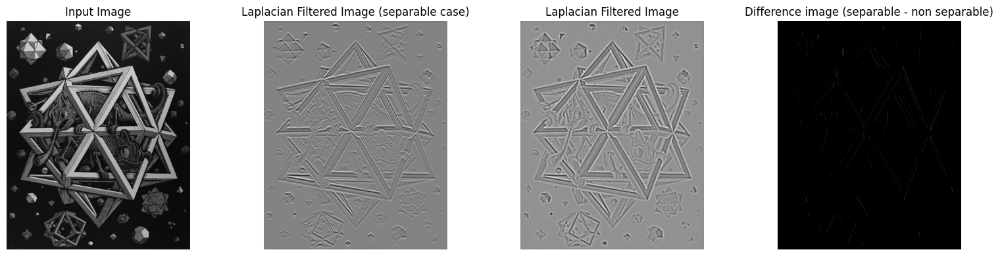

In [ ]:
img = rgb2gray(np.array(Image.open("images/stella.jpg")))
derived_img_separable = laplacefiltering(img, sigma=3, filter_size=19)
derived_img_non_separable = laplacefiltering2D(img, sigma=3, filter_size=19)
def normalize(img):
    return (img - img.min()) / (img.max() - img.min())
derived_img_non_separable = normalize(derived_img_non_separable)
derived_img_separable = normalize(derived_img_separable)
difference_img = derived_img_separable - derived_img_non_separable

plot_pictures(
    [img/255, derived_img_separable, derived_img_non_separable, difference_img],
    ["Input Image", "Laplacian Filtered Image (separable case)", "Laplacian Filtered Image", "Difference image (separable - non separable)"],
    nrows=1,ncols=4,cmap="gray",vmin=0,vmax=1
)

assert ssim(derived_img_separable, derived_img_non_separable, data_range=1) > 0.6, "The separable and non-separable Laplacian filters are not the same."

##### **Gaussian Blur Filter**

Implement a 2D Gaussian filter.
Make it so that the filter size changes adaptively with the size of sigma, and round it up to the nearest **odd** integer.
$$
\verb|filter_size| = \lceil 6\sigma \rceil
$$

See the figure below for an illustration of the blurring filter:

![](./images/moon_gauss.jpg)

In [ ]:
def gaussfiltering(img: np.ndarray, sigma: int) -> np.ndarray:
    """
    Implement a 2D Gaussian filter, leveraging the previous gauss.

    Args:
        img (np.ndarray): Input image.
        sigma (int): Standard deviation.

    Returns:
        smooth_img (np.ndarray): Smoothed image.
    """

    filter_size = int(np.ceil(6 * sigma))
    if filter_size % 2 == 0:
        filter_size += 1

    Gx, _ = gauss(sigma, filter_size)



    G = Gx[:, np.newaxis] * Gx[np.newaxis, :]

    # Apply the Gaussian filter using convolution
    if img.ndim == 2:  # Grayscale image
        out = convolve2d(img, G, mode='same', boundary='symm')
    elif img.ndim == 3:  # Color image -- apply a 2D Gaussian filter to each color channel of an image separately and then stack the filtered channels
        out = np.stack([convolve2d(img[..., c], G, mode='same', boundary='symm') for c in range(img.shape[-1])], axis=-1)
    return out

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

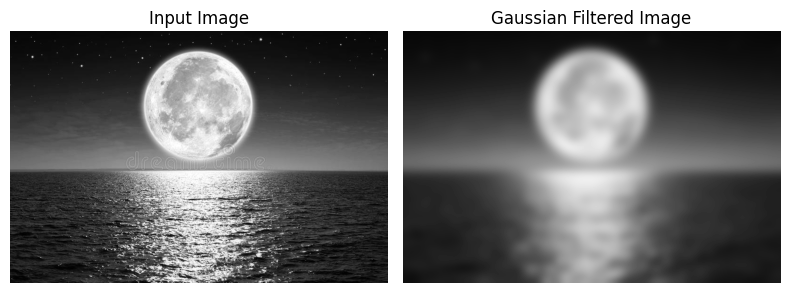

In [ ]:
img = rgb2gray(np.array(Image.open("images/moon.jpg")))
imgs = [img, gaussfiltering(img, 10)]
labels = ["Input Image", "Gaussian Filtered Image"]
plot_pictures(imgs, labels, nrows=1, ncols=2, cmap="gray", vmin=0, vmax=255)

#### **Discrete Laplacian Operator**

Write the [discrete Laplacian filter](https://en.wikipedia.org/wiki/Discrete_Laplace_operator), which is a discrete approximation of the Laplacian Filter, speciic for image processing.

Now, given an image $x$, a Gaussian filter $G(x)$ and a discrete Laplacian filter $L(x)$, compute:
- $ G(L(x)) $
- $ L(G(x)) $

And check that the $SSIM = 1$

See the figure below for illustration of the discrete Laplacian:

![](./images/laplacian.png)

In [ ]:
def discrete_laplace(img: np.ndarray) -> np.ndarray:
    """
    Discrete Laplacian operator.

    Args:
        img (np.ndarray): Input image.

    Returns:
        Lap (np.ndarray): Image after applying the Laplacian operator.
    """

    kernel = np.array([[0, 1, 0],
                       [1, -4, 1],
                       [0, 1, 0]])

    Lap = convolve2d(img, kernel)

    return Lap


img = rgb2gray(np.array(Image.open("./images/lenna.jpg")))
sigma = 1.0
#discrete laplacian operator and smoothen using gaussian filter
image_edges = discrete_laplace(img)
image_edges_smoothed =  gaussfiltering(image_edges, sigma)
#smoothen then apply discrete laplacian operator
image_smoothed = gaussfiltering(img, sigma)
image_smoothed_edges = discrete_laplace(image_smoothed)

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

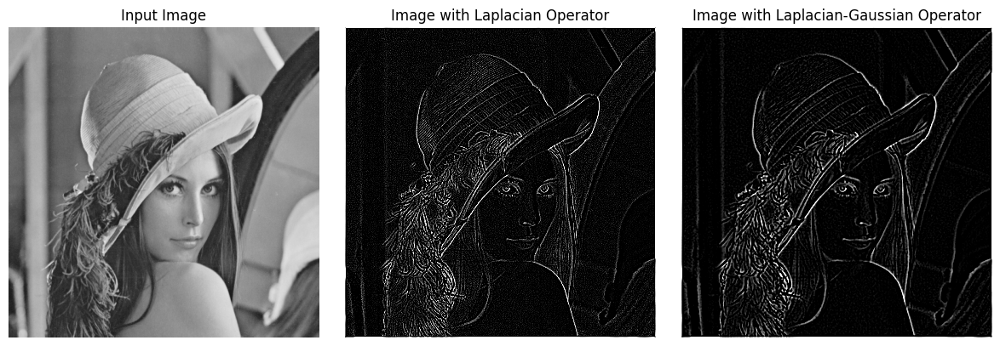

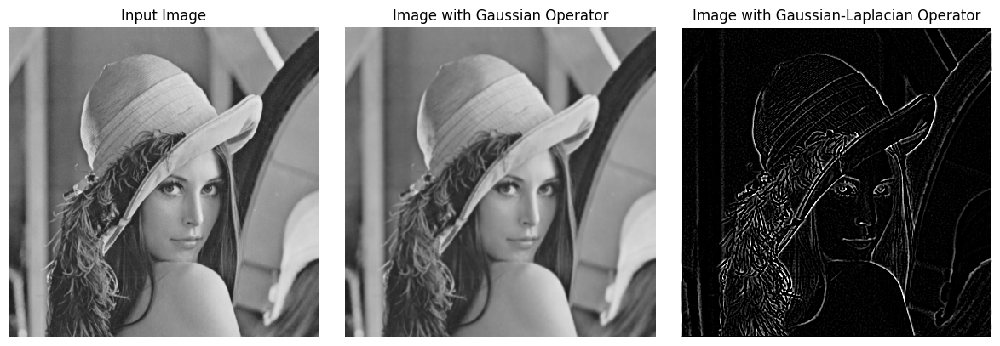

In [ ]:
# LoG
imgs = [img, image_edges*5, image_edges_smoothed*10]
labels = [
    "Input Image",
    "Image with Laplacian Operator",
    "Image with Laplacian-Gaussian Operator",
]
plot_pictures(imgs, labels, nrows=1, ncols=3, cmap="gray", vmin=0, vmax=255)

# GoL
imgs = [img, image_smoothed, image_smoothed_edges*10]
labels = [
    "Input Image",
    "Image with Gaussian Operator",
    "Image with Gaussian-Laplacian Operator",
]
plot_pictures(imgs, labels, nrows=1, ncols=3, cmap="gray", vmin=0, vmax=255)


assert ssim(
            image_edges_smoothed,
            image_smoothed_edges,
            data_range=image_edges_smoothed.max() - image_edges_smoothed.min(),
        ) > 0.9, "The LoG and GoL operators should have similar results."


## **Question 2: Multi-Scale Image Representations**

Edges represents object boundaries, thus edge detection is a very important preprocessing step for any object detection or recognition process.
Simple edge detection kernels are based on approximation of gradient images.

You will use some basic edge detection kernels.

### **2.1: Prewitt Operator** *(2 points)*
The [Prewitt operator](https://en.wikipedia.org/wiki/Prewitt_operator) is used in image processing, particularly within edge detection algorithms.
Technically, it is a discrete differentiation operator, computing an approximation of the gradient of the image intensity function.

See figure below for illustration of Prewitt operators in action:

<img src="https://upload.wikimedia.org/wikipedia/commons/3/3f/Bikesgray.jpg" width="300"/> <img src="https://upload.wikimedia.org/wikipedia/commons/3/3e/Bikesgray_prewitt.JPG" width="300"/>

Now implement the Prewitt operators. Try to take advantage of the separability of this filter.

In [ ]:
def prewitt_x(img: np.ndarray) -> np.ndarray:
    """
    Implement a 3x3 Prewitt discrete operator for vertical edges.

    Args:
        img (np.ndarray): Input image.

    Returns:
        Fx (np.ndarray): Image with vertical edges.
    """
    #prewitt kernel for vertical edges
    prewitt_kernel_x = np.array([[1, 0, -1],
                                 [1, 0, -1],
                                 [1, 0, -1]])

    # apply convolution using the prewitt kernel
    out = convolve2d(img, prewitt_kernel_x, mode='same', boundary='fill', fillvalue=0)

    return out

def prewitt_y(img: np.ndarray) -> np.ndarray:
    """
    Implement a 3x3 Prewitt discrete operator for horizontal edges.

    Args:
        img (np.ndarray): Input image.

    Returns:
        Fx (np.ndarray): Image with horizontal edges.
    """
    #prewitt kernel for horizontal edges
    prewitt_kernel_y = np.array([[1, 1, 1],
                                 [0, 0, 0],
                                 [-1, -1, -1]])

    #apply convolution using the prewitt kernel
    out = convolve2d(img, prewitt_kernel_y, mode='same', boundary='fill', fillvalue=0)

    return out

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

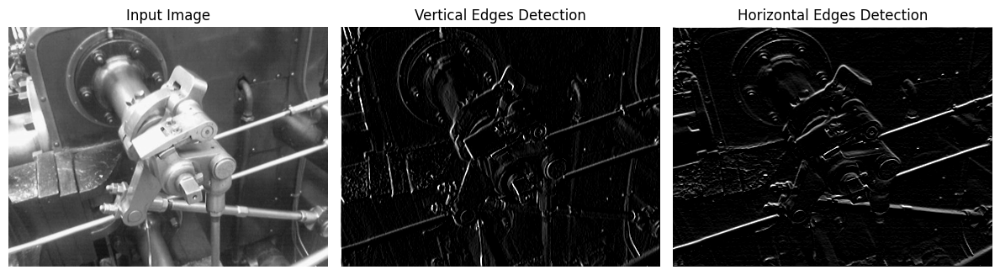

In [ ]:
img = rgb2gray(np.array(Image.open("images/valve.png")))
imgs = [img, prewitt_x(img), prewitt_y(img)]
labels = ["Input Image", "Vertical Edges Detection", "Horizontal Edges Detection"]
plot_pictures(imgs, labels, nrows=1, ncols=3, cmap="gray", vmin=0, vmax=255)

#### Gradient Magnitude
Using the previously defined functions `prewitt_x` and `prewitt_y`, retrieve the gradient magnitude of the image.

See the figure below for an illustration of the Gradient Magnitude:

![](./images/sobel.png)

In [ ]:
def gradient_magnitude(img: np.ndarray) -> np.ndarray:
    """
    Apply the Prewitt operator to the image and compute
    the gradient magnitude.

    Args:
        img (np.ndarray): Input image.

    Returns:
        magnitude (np.ndarray): Gradient magnitude.
    """

    #apply the prewitt operator for vertical edges(to get the gradient in the x direction)
    Gx = prewitt_x(img)
    #apply the prewitt operator for horizontal edges(to get the gradient in the y direction)
    Gy = prewitt_y(img)
    #use Euclidean norm to get the gradient magnitude
    magnitude = np.sqrt(Gx**2 + Gy**2)

    return magnitude

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

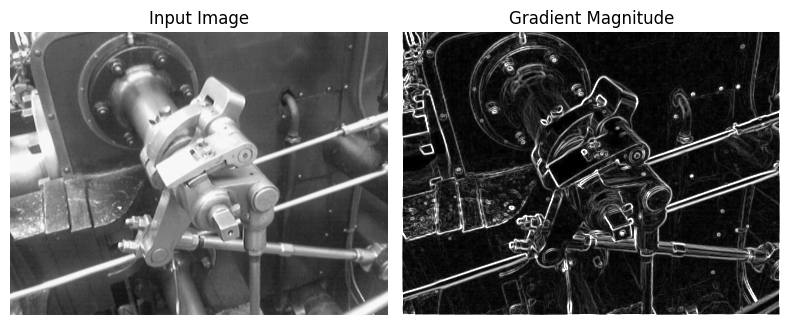

In [ ]:
img = rgb2gray(np.array(Image.open("images/valve.png")))
igms = [img, gradient_magnitude(img)]
labels = ["Input Image", "Gradient Magnitude"]
plot_pictures(igms, labels, nrows=1, ncols=2, cmap="gray", vmin=0, vmax=255)

### **2.2 Canny Edge Detector and Template Matching** 
The Canny edge detector is an edge detection operator that uses a multi-stage algorithm to detect a wide range of edges in images.

The Canny edge detection algorithm is composed of 5 steps:

1. Noise reduction: apply Gaussian filter to smooth the image in order to remove the noise
2. Gradient calculation: find the intensity gradients of the image
3. Non-maximum suppression: apply gradient magnitude thresholding or lower bound cut-off suppression to get rid of spurious response to edge detection
4. Double threshold: apply double threshold to determine potential edges
5. Edge Tracking by Hysteresis: track edge by hysteresis: finalize the detection of edges by suppressing all the other edges that are weak and not connected to strong edges.


You can learn more about the Canny edge detector at the following links:
- [Canny Edge Detection](https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html).
- [Canny Edge Detection Step by Step in Python — Computer Vision](https://towardsdatascience.com/canny-edge-detection-step-by-step-in-python-computer-vision-b49c3a2d8123).
- [What is a Canny Edge Detection Algorithm?](https://towardsai.net/p/computer-vision/what-is-a-canny-edge-detection-algorithm).

##### **Stage 1** - *Noise reduction*

Apply Gaussian filter to smooth the image in order to remove the noise.
**You just need to run the code for this stage**.

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

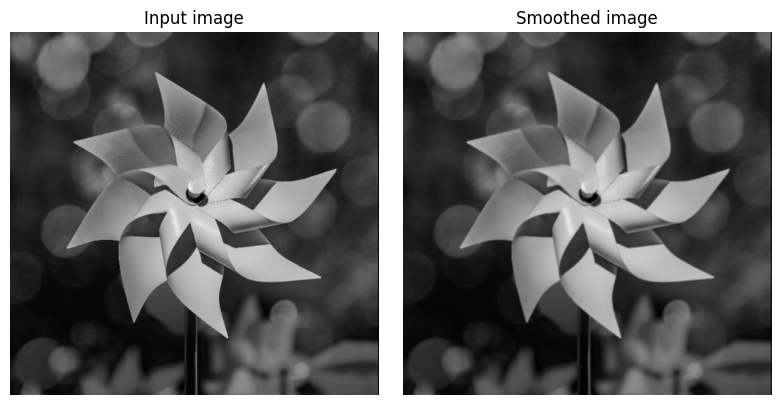

In [36]:
# STEP 1:
img = rgb2gray(np.array(Image.open("images/pinwheel.jpg")))
smoothed_img = gaussfiltering(img, sigma=1)

plot_pictures([img, smoothed_img], ["Input image", "Smoothed image"], 1, 2, vmax=255)

##### **Stage 2** - *Gradient calculation*

This step detects edges intensity and direction by calculating the gradient of the image through edge detection operators.

Edges correspond to a change of pixels’ intensity, the easiest way to detect it is applying filters that highlight it in both directions: horizontal ($x$) and vertical ($y$).

When the image is smoothed, the derivatives $D_x(I)$ and $D_y(I)$ w.r.t. $x$ and $y$ are calculated.
It can be implemented by convolving $I$ with Prewitt kernels $K_x$ and $K_y$, respectively.

Taking advantage of the functions `prewitt_x` and `prewitt_y` you have previously implemented, compute the gradient magnitude and direction of the image.
Your function will output the magnitude $G$ and the slope $\theta$ of the gradient.
Scale the magnitude to the range $[0,255]$.

In [37]:
# STEP 2
def prewitt_filters(img: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    This function applies the prewitt filter to the input image in x and y direction.
    Scale    the magnitude to [0, 255] and return the magnitude and the direction of the gradient.

    Args:
        img (np.ndarray): input image

    Returns:
        G (np.ndarray): gradient magnitude
        theta (np.ndarray): gradient direction
    """


    #apply the prewitt operator for vertical edges(to get the gradient in the x direction)
    Gx = prewitt_x(img)
    #apply the prewitt operator for horizontal edges(to get the gradient in the y direction)
    Gy = prewitt_y(img)
    #use Euclidean norm to get the gradient magnitude
    G = np.sqrt(Gx**2 + Gy**2)
    #scale the magnitude to the range [0, 255]
    G = (G / G.max()) * 255
    #gradient direction (angle) in radians
    theta = np.arctan2(Gy, Gx)

    return (G, theta)

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

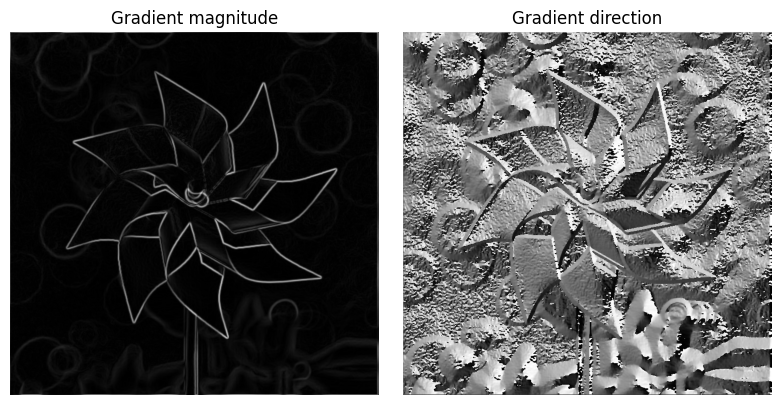

In [38]:
G, theta = prewitt_filters(smoothed_img)

plot_pictures([G, theta], ["Gradient magnitude", "Gradient direction"], 1, 2)

##### **Stage 3** - *Non-maximum suppression*

The image is scanned along the image gradient direction and, if pixels are not part of the local maxima, they are set to zero.
This has the effect of suppressing all image information that is not part of local maxima.

In [39]:
def direction_scan(
    img: np.ndarray, theta: float, i:int, j:int
    ) -> List[float]:
    """
    This function quantizes the gradient directions into
    four discrete directions:
        - horizontal: theta in [0, 22.5) or [157.5, 180]
        - right diagonal: theta in [22.5, 67.5)
        - vertical: theta in [67.5, 112.5)
        - left diagonal: theta in [112.5, 157.5)
    then it returns the pixel values of the two pixels in
    the corresponding direction.

    Returns:
        neighbors List[float]: pixel values of the two neighbors
            in the corresponding direction
    """
   #####################################################
    ##            FIX THIS CODE (8 ERRORS)             ##
    #####################################################
    #6. Including negative angles
    angle = theta[i, j]*180 / np.pi
    #7.Normalize angles to be in the range [0, 180]
    angle = angle if angle >= 0 else angle+180

    # 1 and 2. Incorrect angle condition
    if (0 <= angle < 22.5) or (157.5 <= angle <= 180):
        neighbors = [(i, j+1), (i, j-1)]
    # 3.Repeated angle condition
    elif 22.5 <= angle < 67.5:
        neighbors = [(i+1, j+1), (i-1, j-1)]
    # 4.Repeated angle condition
    elif 67.5 <= angle < 112.5:
        neighbors = [(i+1, j), (i-1, j)]
    else:
        neighbors = [(i+1, j-1), (i-1, j+1)]

    M, N = img.shape
    # 5.Image boundaries are not checked
    pixels = [img[x, y] for x, y in neighbors if 0 <= x < M and 0 <= y < N]
    return pixels

def non_max_suppression(img: np.ndarray, D: np.ndarray) -> np.ndarray:
    """
    This function performs non-maximum suppression on the input image.

    Args:
        img (np.ndarray): input image
        D (np.ndarray): gradient direction

    Returns:
        Z (np.ndarray): image after non-maximum suppression
    """

    M, N = img.shape
    Z = np.zeros((M, N), dtype=np.uint8)

    for i in range(1, M - 1):
        for j in range(1, N - 1):
            neig = direction_scan(img, D, i, j)
            # Suppress non-maximum pixels
            if img[i, j] >= max(neig):
                Z[i, j] = img[i, j]
            pass

    return (Z / Z.max() * 255).astype(np.uint8)

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

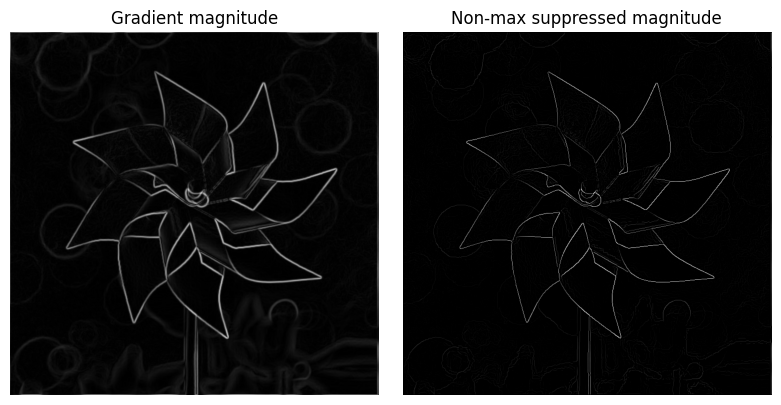

In [40]:
Z = non_max_suppression(G, theta)

plot_pictures(
    [G, Z],
    ["Gradient magnitude", "Non-max suppressed magnitude"],
    1,
    2,
)

##### **Stage 4** - *Thresholding*

After application of non-maximum suppression, remaining edge pixels provide a more accurate representation of real edges in an image.
However, some edge pixels remain that are caused by noise and color variation.
To account for these spurious responses, it is essential to filter out edge pixels with a weak gradient value and preserve edge pixels with a high gradient value.

This is accomplished by selecting high and low threshold values:
- If an edge pixel’s gradient value is higher than the high threshold value, it is marked as a strong edge pixel.
- If an edge pixel’s gradient value is smaller than the high threshold value and larger than the low threshold value, it is marked as a weak edge pixel.
- If an edge pixel's gradient value is smaller than the low threshold value, it will be suppressed.

Implement the function `threshold` that takes as input the image, the low and high threshold ratios and returns a tuple whose elements are the thresholded image, the value of the weak edges and the value of the strong edges. Set the value of weak edges to 100 and the value of strong edges to 255.

In [41]:
# STEP 4
def threshold(
    img: np.ndarray,
    low_threshold: int = 100, high_threshold: int = 200,
    weak_value :int = 100, strong_value: int = 255
) -> np.ndarray:
    """
    This function applies a double thresholding to the input image.

    Args:
        img (np.ndarray): input image
        low_threshold (int): low threshold
        high_threshold (int): high threshold
        weak_value (int): value for weak edges
        strong_value (int): value for strong edges

    Returns:
        res (np.ndarray): thresholded image
    """

    i_height, i_width = img.shape #img dimensions
    res = np.zeros((i_height, i_width), dtype=np.uint8) #initialize black img with img dimensions
    #####################################################
    strong_i, strong_j = np.where(img >= high_threshold) #get strong edges based on high_threshold)
    weak_i, weak_j = np.where((img >= low_threshold) & (img < high_threshold))  #get weak edges based on low_threshold)
    #set the strong edges to the specified strong_value
    res[strong_i, strong_j] = strong_value
    #set the weak edges to the specified weak_value
    res[weak_i, weak_j] = weak_value

    return res

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

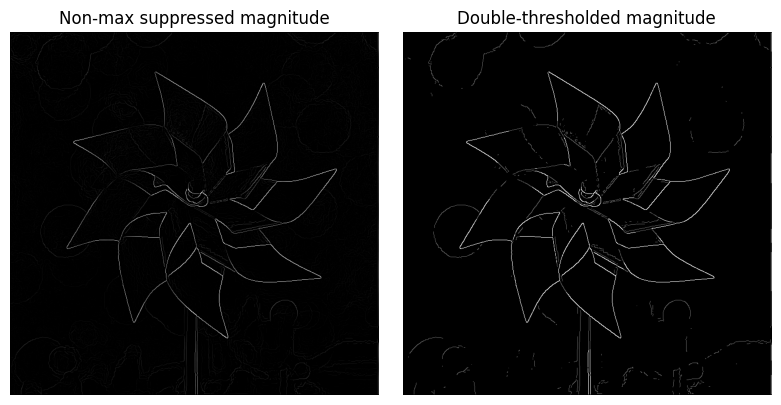

In [42]:
weak_value = 100
strong_value = 255
res = threshold(Z, low_threshold=25, high_threshold=100, weak_value=weak_value, strong_value=strong_value)

plot_pictures(
    [Z, res],
    ["Non-max suppressed magnitude", "Double-thresholded magnitude"],
    1,
    2,
)

##### **Stage 5** - *Hysteresis*

Based on the threshold results, the hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one.

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [43]:
# STEP 5
def hysteresis(img: np.ndarray, weak: int = 100, strong: int = 255) -> np.ndarray:
    """
    This function applies hysteresis to the input image.

    Args:
        img (np.mdarray): input image.
        weak (int): weak threshold.
        strong (int): strong threshold.

    Returns:
        img (np.ndarray): image after hysteresis.
    """
    M, N = img.shape
    img_ = img.copy()
    strong_edges_idxs = np.argwhere(img == strong).tolist()
    while len(strong_edges_idxs) > 0:
        i, j = strong_edges_idxs.pop()
        if (i - 1 >= 0) and (j - 1 >= 0) and (i + 1 < M) and (j + 1 < N):
            weak_edges_mask = img_[i - 1 : i + 2, j - 1 : j + 2] == weak
            if np.any(weak_edges_mask):
                img_[i - 1 : i + 2, j - 1 : j + 2][weak_edges_mask] = strong
                weak_edges_idxs = (
                    (np.argwhere(weak_edges_mask) - 1) + np.array([i, j])
                ).tolist()
                strong_edges_idxs = strong_edges_idxs + weak_edges_idxs[::-1]
    img_[img_ != strong] = 0
    return img_

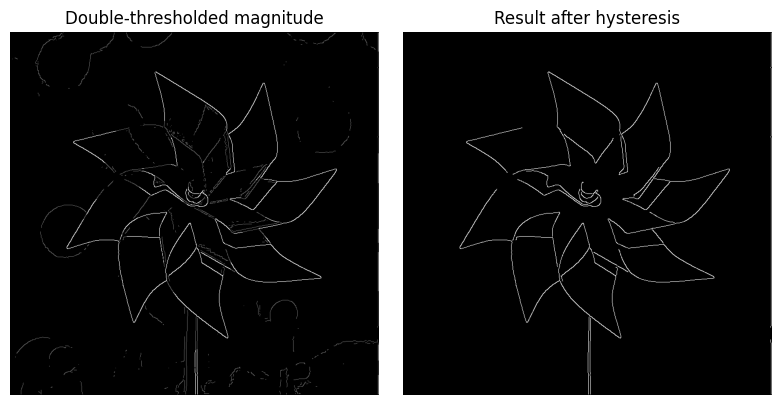

In [44]:
final_img = hysteresis(res, weak=weak_value)

plot_pictures(
    [res, final_img],
    ["Double-thresholded magnitude", "Result after hysteresis"],
    1,
    2,
)


##### **Wrap up**
Once you have seen how the Canny edge detector works step by step, implement the following `canny_edge_detector` function that wraps all the previous steps and returns the final image.

In [45]:
def canny_edge_detector(
    img: np.ndarray, sigma: float = 1,
    low_threshold: int = 50, high_threshold: int = 100
) -> np.ndarray:
    """
    This function implements the Canny edge detector.
    Put together the previous functions to implement the
    Canny edge detector.
    Don't apply the gaussian filter if sigma=0.

    Args:
        img (np.ndarray): input image
        sigma (int): standard deviation for the gaussian filter;
            if sigma=0, no gaussian filter is applied
        low_threshold (int): low threshold
        high_threshold (int): high threshold

    Returns:
        out_img (np.ndarray): image after applying the Canny edge
            detector
    """
    weak_value = 100

    # Step 1: Noise reduction (Apply Gaussian filter)
    if sigma > 0:
        img = gaussfiltering(img, sigma=sigma)

    # Step 2: Gradient calculation (Prewitt filters)
    G, theta = prewitt_filters(img)

    # Step 3: Non-maximum suppression
    Z = non_max_suppression(G, theta)

    # Step 4: Thresholding
    res = threshold(Z, low_threshold=low_threshold, high_threshold=high_threshold, weak_value=weak_value, strong_value=strong_value)

    # Step 5: Hysteresis
    out_img = hysteresis(res, weak=weak_value, strong=strong_value)

    return out_img

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

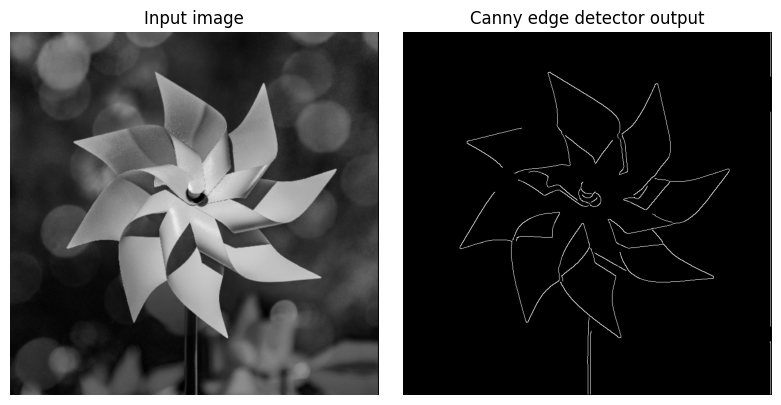

In [46]:
img = rgb2gray(np.array(Image.open("images/pinwheel.jpg")))
out_img = canny_edge_detector(img, sigma=2, low_threshold=35, high_threshold=100)

plot_pictures(
    [img, out_img],
    ["Input image", "Canny edge detector output"],
    1,
    2,
)

#### **2.2.1: Template matching**

In this section, you are going to implement a template matching algorithm.
The goal of template matching is to find the patch in the image that is most similar to a given template.
In this exercise, you are going to use the Canny edge detector to extract the edges of the image and the template.
Then, you will find the patch in the image that is most similar to the template.
To choose the patch, you are asked to implement the [Jaccard Similarity](https://en.wikipedia.org/wiki/Jaccard_index) metric:
\begin{equation}
\mathrm{Jaccard}(I_{ij}, T)
= \frac{|I_{ij} \cap T|}{|I_{ij} \cup T|}
%= \frac{\verb|sum|(I_{ij} \land T)}{\verb|sum|(I_{ij} \lor T)}
\end{equation}

In practice we can compute this by computing the ratio between the number of pixels where both $T$ and $I_{ij}$ have an edge and the number of pixels where $T$ or $I_{ij}$ have an edge.
Note that $T$ denotes the template image, $I$ the target image, $I_{ij}$ a patch of $I$ at position $ij$ having the same dimensions of $T$.

Implement the following function that takes as input the target image $I$, and the template image $T$. The returned values are a matrix of shape `(i_height-t_heigh, i_width-t_width)` containing the metric scores at each position and the indexes $(i,j)$ of the patch in $I$ with the best metric value, as depicted below. Note that $i$ indexes along the height of $I$, $j$ indexes along the width of $I$.

```
(i,j)-------width--------+
  |                      |
  |                      |
height                   |
  |                      |
  |                      |
  +----------------------+
```

In [47]:
def jaccard(patch:np.ndarray,template:np.ndarray) -> float:
    """
    This function computes the Jaccard similarity between
    two images.

    Args:
        patch (np.array): patch of the input image
        template (np.array): template to match

    Returns:
        jaccard_score (float)
    """
    #####################################################

     # Assuming binary images with values 0 and 1
    intersection = np.sum((patch > 0) & (template > 0))
    union = np.sum((patch > 0) | (template > 0))

    # Handle case where union is 0 to avoid division by zero
    jaccard_score = intersection / union if union > 0 else 0.0

    return jaccard_score

def match_template(
    img: np.ndarray, template: np.ndarray
) -> Tuple[np.ndarray, Tuple[int, int]]:
    """
    This function implements the template matching algorithm.

    Args:
        img (np.ndarray): input image.
        template (np.array): template to match.

    Returns:
        img_score (np.ndarray): metric scores after applying the template matching algorithm.
        best_match_idxs (tuple): index of the best match.
    """
    t_height, t_width = template.shape
    i_height, i_width = img.shape
    assert (i_height >= t_height) and (
        i_width >= t_width
    ), f"Cannot match template of shape {template.shape} with image of shape {img.shape}"
    img_score = np.zeros((i_height - t_height + 1, i_width - t_width + 1))

    #####################################################

    # Loop over each position where the template can fit
    for i in range(i_height - t_height + 1):
        for j in range(i_width - t_width + 1):
            #patch from the image
            patch = img[i:i + t_height, j:j + t_width]
            img_score[i, j] = jaccard(patch, template)

    #caluculate the jaccard similarity for the patch
    best_match_idxs = np.unravel_index(np.argmax(img_score), img_score.shape)

    return img_score, best_match_idxs



--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

*Note: by running the following code, you should be able to detect the bigger Wally.*

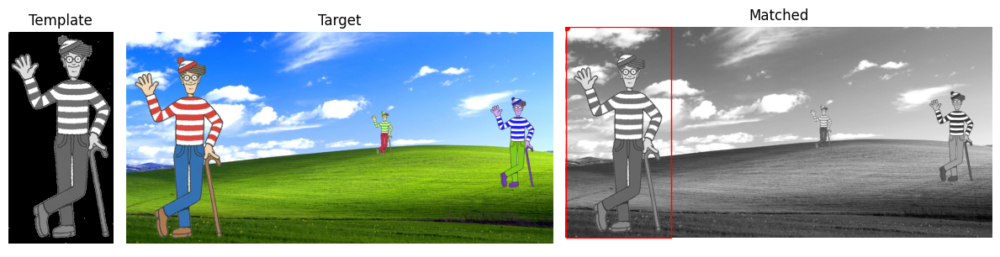

In [48]:
import matplotlib.patches as patches

img_1 = rgb2gray(np.array(Image.open("images/wally.jpg")))
img_2 = rgb2gray(np.array(Image.open("images/findwally.jpg")))

template = canny_edge_detector(img_1, sigma=1.5, low_threshold=40, high_threshold=100)
target = canny_edge_detector(img_2, sigma=1, low_threshold=25, high_threshold=100)

imgs = [img_1, np.array(Image.open("images/findwally.jpg")), img_2]
xlabels = ["Template", "Target", "Matched"]
axs = plot_pictures(imgs, xlabels, 1, 3, show=False, vmin=None, vmax=None)
img_score, best_match = match_template(target, template)

axs[-1].plot(best_match[1], best_match[0], "ro")
axs[-1].add_patch(
    patches.Rectangle(
        (best_match[1], best_match[0]),
        template.shape[1],
        template.shape[0],
        linewidth=1,
        edgecolor="r",
        facecolor="none",
    )
)

plt.show()

Here you can look at the template and at target image side by side, after having applied the Canny edge detector.
Notice how they are different even though the parameters of the Canny edge detector are the same: this is due to the images not having the same background.

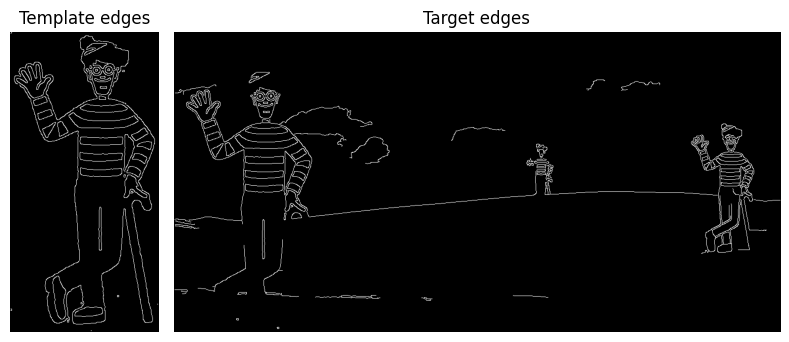

In [ ]:
imgs = [template, target]
xlabels = ["Template edges", "Target edges"]
plot_pictures(imgs, xlabels, 1, 2, show=True, cmap="gray", same_scale=True)

### **2.3 Harris Corner Detector** 

The Harris Corner Detector is a feature detection method used in computer vision to find corners, which are points with significant intensity changes in multiple directions. It works by analyzing image gradients to identify regions where shifting a small window results in large intensity variations.

It can be considered a variation of the Canny Edge Detector. Implement it by leveraging the previously implemented functions.

For more information: [link](https://en.wikipedia.org/wiki/Harris_corner_detector)

In [29]:
def harris_corner_detector(
    img: np.ndarray,
    sigma: float = 1,
    k: float = 0.04,
    threshold: float = 1e-2) -> np.ndarray:
    """
    Harris Corner Detector.

    Args:
        img (np.ndarray): Input grayscale image.
        sigma (float): Standard deviation for Gaussian smoothing.
        k (float): Sensitivity factor to separate corners from edges.
        threshold (float): Threshold for detecting corners.

    Returns:
        corners (np.ndarray): Image with corners marked.
    """
   
    # Step 1: Smooth the image
    ##sigma controls how much noise is reduced
    img =  gaussfiltering(img=img,sigma=sigma) if sigma != 0 else img

    # Step 2: Compute the gradients
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

    dx, dy = convolve2d(img, sobel_x,mode='same'), convolve2d(img, sobel_y,mode='same')
    dx2 = dx**2
    dxy = dx*dy
    dy2 = dy**2

    # Step 3: Compute the sums of the products of gradients
    window = np.ones((3, 3))
    Sxx = convolve2d(dx2, window, mode='same')
    Sxy = convolve2d(dxy, window, mode='same')
    Syy = convolve2d(dy2, window, mode='same')

    # Step 4: Compute the determinant and trace of the Harris matrix
    det = (Sxx*Syy) - Sxy**2
    trace = Sxx+Syy

    # Step 5: Compute the Harris response
    R = det -k * trace**2

    corners = np.zeros_like(img)
    corners[R>threshold * R.max()] = 255
    return corners

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

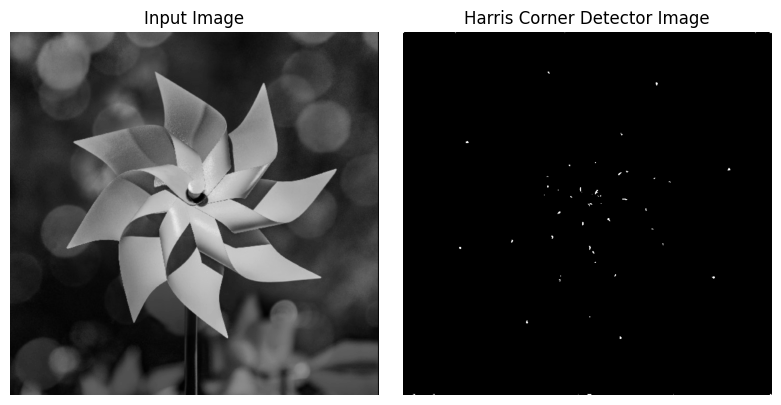

In [30]:
img = rgb2gray(np.array(Image.open("images/pinwheel.jpg")))
imgs = [img, harris_corner_detector(img, 1)]
labels = ["Input Image", "Harris Corner Detector Image"]
plot_pictures(imgs, labels, nrows=1, ncols=2, vmin=0, vmax=255)

### **2.4 Gaussian Pyramid** 

Now let's implement a multi-scale object detection algorithm with Gaussian pyramid and template matching.

**Gaussian Pyramid**

Implement a downscaling function that makes use of the iterative approach described by the Gaussian Pyramid. Use [`skimage.transform.resize`](https://scikit-image.org/docs/stable/api/skimage.transform.html#skimage.transform.resize) to resize the image to a lower scale, but don't forget to first smooth the image.
Repeat this process `step` times.

In [31]:
def downscale(
    img: np.ndarray,
    factor: float,
    steps:int=3,
    sigma:float=1
    ) -> np.ndarray:
    """
    Iteratively apply a gaussian blur to avoid aliasing
    and then downscale the input image by the given factor.

    Args:
        img (np.ndarray): Input image.
        factor (float): Resizing factor, how may times smaller
            is the image going to be.
        steps(int): the number of times to repeat the iteration.
        sigma (float): Standard deviation for the Gaussian filter.

    Returns:
        imgs (list): list of downscaled images. Each one is
            "factor" times smaller then the previous.
        blurred (list): list of blurred images produced in
            the downscaling process.
    """
    imgs = [img]
    blurred = []
    blurrImg = img
 

    for i in range(steps):
        # Apply Gaussian blur to smoothen then store the new blurred img
        blurrImg = gaussfiltering(blurrImg, sigma=sigma)
        blurred.append(blurrImg)

        # Get the dimensions (height,width) of the last image in the imgs list
        imgHeight, imgWidth = imgs[-1].shape[:2]
        newHeight, newWidth = int(imgHeight / factor), int(imgWidth / factor)

        # Downscale the blurred image
        downscaled = resize(blurrImg, (newHeight, newWidth), anti_aliasing=True)

        # Store in the list the downscaled image
        imgs.append(downscaled)

        # Update the blurred image so its the input of the next iteration
        blurrImg = downscaled

    return imgs, blurred

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

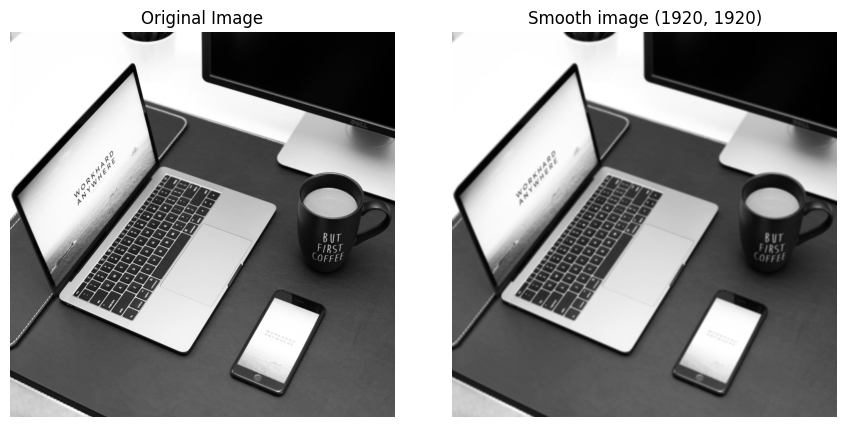

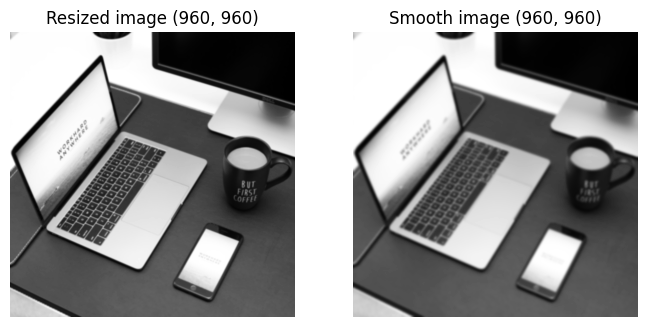

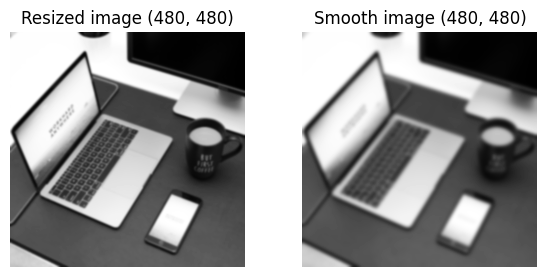

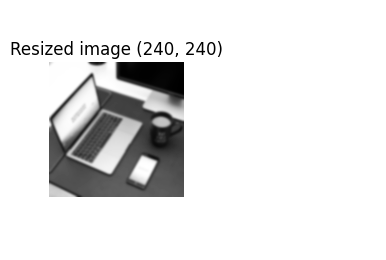

In [32]:
img = rgb2gray(np.array(Image.open("images/coffee.jpg")))
STEPS = 3
imgs, img_blur = downscale(img, 2, steps=STEPS, sigma=3)

for i in range(STEPS+1):
    fig, axes = plt.subplots(1, 2, figsize=(int(12* .8**(i+1)),int(8* .8**(i+1))))
    plt.gray()
    fig.tight_layout()
    axes[0].imshow(imgs[i])
    axes[0].set_title(f"Resized image {imgs[i].shape}" if i != 0 else "Original Image")
    axes[0].axis('off')
    if i < STEPS:
        axes[1].imshow(img_blur[i])
        axes[1].set_title(f"Smooth image {img_blur[i].shape}")
    axes[1].axis('off')

##### **Aliasing**

When an image is downscaled, some information is inevitably lost. If this process isn't handled carefully, it can lead to distortions such as jagged edges, moiré patterns, or a "stair-step" effect on diagonal lines. This kind of effect is called "Aliasing".

![](https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2F1.bp.blogspot.com%2F-AWQvtxVtBBY%2FV9F03wJwAnI%2FAAAAAAAAA7A%2FVfGtkgT8O60Y9jBx5hXT1ixw4URaqxHWQCLcB%2Fs1600%2FSupersampling%252B2D%252Banti-aliasing.gif&f=1&nofb=1&ipt=0de5f53f14ec430997ea1d210e4f6ab6bcb5131861fe84ddeeb14e15be689527&ipo=images)

These artifacts arise because the sampling rate of the new, smaller image is insufficient to accurately represent the high frequency details present in the original image. This is related to the Nyquist-Shannon sampling theorem, which states that to accurately represent a signal, the sampling rate must be at least twice the highest frequency present in the signal.
To mitigate aliasing when downscaling, various techniques can be employed, such as applying low-pass filters before reducing the image size (i.e. a Gaussian blur).

Now confront the results of downscaling with the gaussian pyramid that you just implemented against a naive resizing.

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

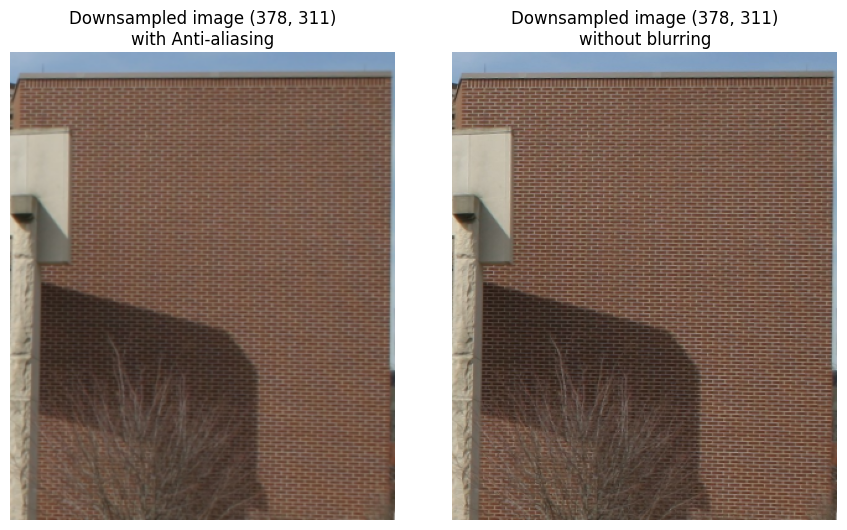

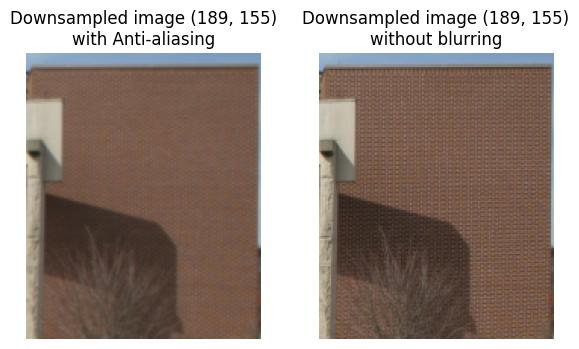

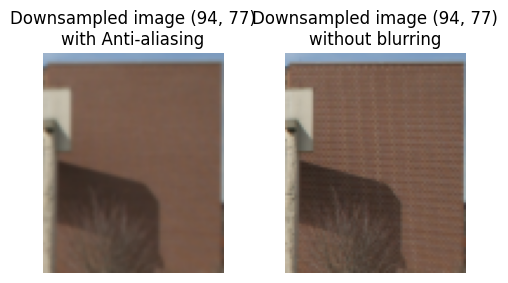

In [ ]:
img = np.array(Image.open("images/bricks.jpg"))
img_no_blur = np.array(Image.open("images/bricks.jpg"))

imgs, img_blur = downscale(img, 2, steps=STEPS, sigma=1)


for i in range(3):
    img = imgs[i+1]
    img_no_blur = resize(img_no_blur, (img_no_blur.shape[0] //2, img_no_blur.shape[1] // 2))

    fig, axes = plt.subplots(1, 2, figsize=(int(12* .75**(i+1)),int(8* .8**(i+1))))
    plt.gray()
    fig.tight_layout()
    axes[0].imshow(img.astype(int))
    axes[0].set_title(f"Downsampled image {img.shape[:2]}\nwith Anti-aliasing")
    axes[0].axis('off')
    axes[1].imshow(img_no_blur)
    axes[1].set_title(f"Downsampled image {img_no_blur.shape[:2]}\nwithout blurring")
    axes[1].axis('off')
    plt.show()

**QUESTION**

Which differences do you notice between the first and the second image?
What is the cause of the Aliasing effect?

-------------------------------------------------------


**WRITE YOU ANSWER HERE**


-------------------------------------------------------

The differences between the two images are noticeable in terms of edge quality and visual coherence. In the first image, which has been downscaled with anti-aliasing using a Gaussian blur, the edges appear smoother, and the image is more consistent overall. In contrast, the second image, downscaled without blurring, displays clear artifacts such as jagged edges and distortions, particularly along diagonal lines.

The aliasing effect occurs because, when the image is downscaled without applying a low-pass filter like the Gaussian blur, the reduced sampling rate is inadequate to accurately represent high-frequency details. This leads to visual artifacts, including jagged edges and patterns such as moiré.

### **2.5: Multi-Scale Template Matching**
Write a multi-scale object detection algorithm using the Gaussian Pyramid and the template matching algorithm you have implemented in the previous exercise.

In [49]:
def multi_scale_match_template(
    img: np.ndarray,
    template: np.ndarray,
    steps: int, factor: float = 2,
    sigma: float = 1,
    low_threshold: int = 30,
    high_threshold: int = 70,
) -> List[Dict[str, Union[np.ndarray, Tuple[int, int]]]]:
    """
    This function implements the multi-scale template matching.

    Args:
        img (np.ndarray): input image.
        template (np.ndarray): template image.
        steps (int): number of steps for the Pyramid.
        sigma (float): the Gaussian filter parameter.
        low_threshold (int): low threshold for Canny edge detector.
        high_threshold (int): high threshold for Canny edge detector.

    Returns:
        out: list of dictionaries containing:
            img_score (np.ndarray): score image.
            result (Tuple[int, int]): best match coordinates.
            template (np.ndarray): template image.
    """
   

    out = []
    templates, blurred_templates = downscale(template, factor=factor, steps=steps, sigma=sigma)
    score_results = []

    for scale_idx, t in enumerate(templates):
        # Run template matching on the scaled template
        score, result = match_template(img, t)

        # Adjust coordinates of the match back to original image scale
        scale_factor = factor ** scale_idx
        adjusted_result = (int(result[0] / scale_factor), int(result[1] / scale_factor))

        score_results.append((score, adjusted_result))

    out = [
        {"img_score": score, "result": result, "template": t}
        for (score, result), t in zip(score_results, templates)
    ]
    return out

In [26]:
def multi_scale_match_template(
    img: np.ndarray,
    template: np.ndarray,
    steps: int, factor: float = 2,
    sigma: float = 1,
    low_threshold: int = 30,
    high_threshold: int = 70,
) -> List[Dict[str, Union[np.ndarray, Tuple[int, int]]]]:
    """
    This function implements the multi-scale template matching.

    Args:
        img (np.ndarray): input image.
        template (np.ndarray): template image.
        steps (int): number of steps for the Pyramid.
        sigma (float): the Gaussian filter parameter.
        low_threshold (int): low threshold for Canny edge detector.
        high_threshold (int): high threshold for Canny edge detector.

    Returns:
        out: list of dictionaries containing:
            img_score (np.ndarray): score image.
            result (Tuple[int, int]): best match coordinates.
            template (np.ndarray): template image.
    """
    img = canny_edge_detector(img, sigma=1, low_threshold=25, high_threshold=100)

    templates, _ = downscale(template, factor=factor, steps=steps)
    templates = [canny_edge_detector(t, sigma, low_threshold, high_threshold) for t in templates]

    score_results = [match_template(img, t) for t in templates]
    out = [{"img_score": score, "result": result, "template": t} for (score, result), t in zip(score_results, templates)]
    return out


_____________________________________________________
**Do not write below this line just run it**
_____________________________________________________



In [33]:
img1 = rgb2gray(np.array(Image.open("images/findwally.jpg")))
img2 = rgb2gray(np.array(Image.open("images/wally.jpg")))

multiscale_res = multi_scale_match_template(
    img=img1,
    template=img2,
    steps=2,
    sigma=1,
    low_threshold=30,
    high_threshold=70,
)


imgs = [img2, np.array(Image.open("images/findwally.jpg"))]
xlabels = [
    "Template",
    "Matched",
]
axs = plot_pictures(imgs, xlabels, 1, 2, show=False, vmin=None, vmax=None)

for d in multiscale_res:
    axs[-1].plot(d["result"][1], d["result"][0], "ro")
    axs[-1].add_patch(
        patches.Rectangle(
            (d["result"][1], d["result"][0]),
            d["template"].shape[1]-2,
            d["template"].shape[0]-2,
            linewidth=1,
            edgecolor="r",
            facecolor="none",
        )
    )
plt.show()

NameError: name 'strong_value' is not defined

## **Question 3: Object Identification** 

*Note: This identification part contains **query and model images** for the evaluation, which correspond to the same set of objects photographed from different viewpoints. The files **model.txt** and **query.txt** contain lists of image files arranged so that i-th model image depicts the same object as i-th query image.*

#### **3.1: 3D Joint Color Histogram** 

Your task is to implement a Python function, histogramdd, from scratch. This function should compute the multidimensional histogram of a given image. The function should accept an image and a specification for the number of bins to use for each dimension. You should then divide the data into bins and count the number of data points that fall into each bin.

If you want to check that your result is correct, you can compare it with the [function already implemented by NumPy](https://numpy.org/doc/stable/reference/generated/numpy.histogramdd.html).

In [ ]:
def histogramdd(img: np.ndarray, bins: int = 10) -> Tuple[np.ndarray, np.ndarray]:
    """
    Follow these steps:
        1) Create bin intervals for each dimension.
        2) Compute the shape of the histogram based on bin intervals.
        3) Initialize the histogram as an array of zeros.
        4) Compute the histogram for the input data.

    Args:
        img (np.ndarray): Input image.
        bins (int): Number of bins.

    Returns:*1.0
        histograms (np.ndarray): Histogram.
        bin_edges (np.ndarray): Bin edges.
    """

   
    #1. Create bin intervals for each dimension.(Range of values that will fall into each interval(bin))
    #We divide these 0-255 into these intervals(here 10)
    #10 bins are defined as 11 edges so 256/10 gives 11 edges
    #Edge(defined by start and end): Start from ex.0 to x then from x to x1 ...
    # So always: edges=# of bins +1
     # 1. Create bin intervals for each dimension.
    r_bins = np.linspace(0, 256, bins + 1)
    g_bins = np.linspace(0, 256, bins + 1)
    b_bins = np.linspace(0, 256, bins + 1)

    # All boundaries stacked together
    bin_edges = np.array([r_bins, g_bins, b_bins])

    # 2. Histogram Shape from bin intervals( ex. 10 * 10 *10)
    HistogramShape = (bins, bins, bins)  # RGB axis

    # 3. Initialize the histogram as an array of zeros.
    histograms = np.ndarray(HistogramShape, dtype=int)  # Create a 3D array

    # Fill the array with zeros so initial values are from 0
    #  when we start filling our bin with values and not from any value from the memory
    histograms.fill(0)

    # 4. Compute the histogram for the input data.
    # Flatten the image array for easier processing
    img_flattened = img.reshape(-1, 3)  # Reshape to (N, 3) for RGB values

    # Use np.digitize to find the bin indices for R, G, B channels
    #continuous to discrete values based on the bin edges
    #-1 for zero based indexing
    r_indices = np.digitize(img_flattened[:, 0], r_bins) - 1
    g_indices = np.digitize(img_flattened[:, 1], g_bins) - 1
    b_indices = np.digitize(img_flattened[:, 2], b_bins) - 1

    # Make sure indices are within bounds (always within our range)
    # to avoid errors of values falling into a bin out of our specified range
    r_indices = np.clip(r_indices, 0, bins - 1)
    g_indices = np.clip(g_indices, 0, bins - 1)
    b_indices = np.clip(b_indices, 0, bins - 1)

    # Increment the histogram at the corresponding bin
    for r_bin, g_bin, b_bin in zip(r_indices, g_indices, b_indices):
        histograms[r_bin, g_bin, b_bin] += 1

    return histograms, bin_edges

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

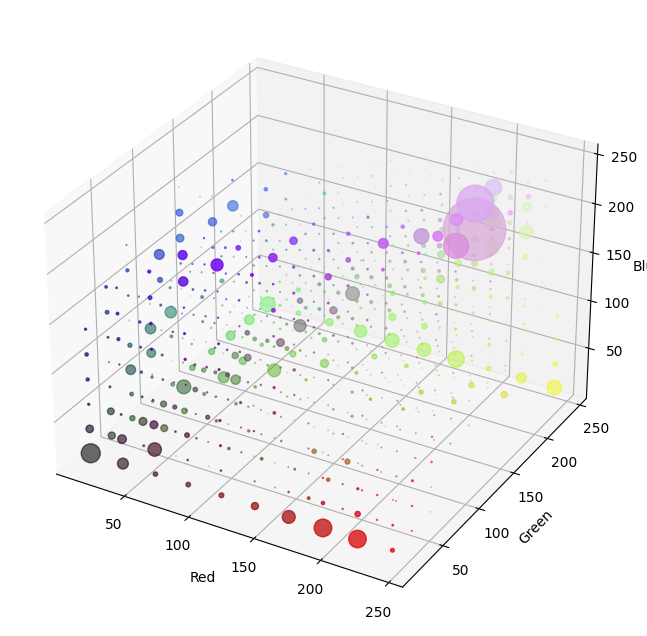

In [ ]:
def histogram3dplot(h, e, fig=None):
    """
    Visualize a 3D histogram

    Parameters
    ----------

    h: histogram array of shape (M,N,O)
    e: list of bin edge arrays (for R, G and B)
    """
    M, N, O = h.shape  # numero di bins
    idxR = np.arange(M)
    idxG = np.arange(N)
    idxB = np.arange(O)

    R, G, B = np.meshgrid(idxR, idxG, idxB)  # divisione per bins
    a = np.diff(e[0])[0]
    b = a / 2
    R = a * R + b

    a = np.diff(e[1])[0]
    b = a / 2
    G = a * G + b

    a = np.diff(e[2])[0]
    b = a / 2
    B = a * B + b

    colors = np.vstack((R.flatten(), G.flatten(), B.flatten())).T / 255
    h = h / np.sum(h)
    if fig is not None:
        f = plt.figure(fig)
    else:
        f = plt.gcf()
    ax = f.add_subplot(111, projection="3d")
    mxbins = np.array([M, N, O]).max()
    ax.scatter(
        R.flatten(),
        G.flatten(),
        B.flatten(),
        s=h.flatten() * (256 / mxbins) ** 3 / 2,
        c=colors,
    )

    ax.set_xlabel("Red")
    ax.set_ylabel("Green")
    ax.set_zlabel("Blue")


img = Image.open("images/colors.jpg")
img = np.array(img)
h, e = histogramdd(img.reshape(-1, 3), bins=10)
histogram3dplot(h, e)

#### **3.2: Types of Histograms** 

In this section, you are asked to implement the **GB** histogram and to correct the dx/dy histogram. Finally, you are asked to comment and compare the results.

##### **GB Histogram**

In this exercise, you should implement the **GB** histogram.

*Note: as before, when considering GB, you should keep in mind that the range of the pixel's intensity is between $0$ and $255$*.

In [ ]:
def gb_hist(img_color_double: np.ndarray, num_bins: int = 5) -> np.ndarray:
    """
    Compute the *joint* histogram for the G and B color channels in the image.
    The histogram should be normalized so that sum of all values equals 1,
    assume that values in each channel vary between 0 and 255

    Args:
        img_color_double (np.ndarray): Input color image.
        num_bins (int): Number of bins used to discretize each channel, total number of bins in the histogram should be num_bins^2.

    Returns:
        hists (np.ndarray): Joint histogram.

    E.g. hists[0,9] contains the number of image_color pixels such that:
        - their G values fall in bin 0
        - their B values fall in bin 9
    """


    #extract green and blue channels
    G = img_color_double[:, :, 1] #green channel
    B = img_color_double[:, :, 2] #blue channel

    bin_edges = np.linspace(0, 256, num_bins + 1)

    G_bin = np.digitize(G, bin_edges) - 1
    B_bin = np.digitize(B, bin_edges) - 1

    #ensure bin indices are within the valid range
    G_bin = np.clip(G_bin, 0, num_bins - 1)
    B_bin = np.clip(B_bin, 0, num_bins - 1)

    #initialize the joint histogram
    hists = np.zeros((num_bins, num_bins))

    #populate the histogram
    for i in range(G.shape[0]):  # Iterate over the height
        for j in range(G.shape[1]):  # Iterate over the width
            hists[G_bin[i, j], B_bin[i, j]] += 1

    # Flatten the histogram to have num_bins^2 on the x-axis
    hists = hists.flatten()
    # Normalize the histogram
    hists /= np.sum(hists)
    # print(hist)
    return hists

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

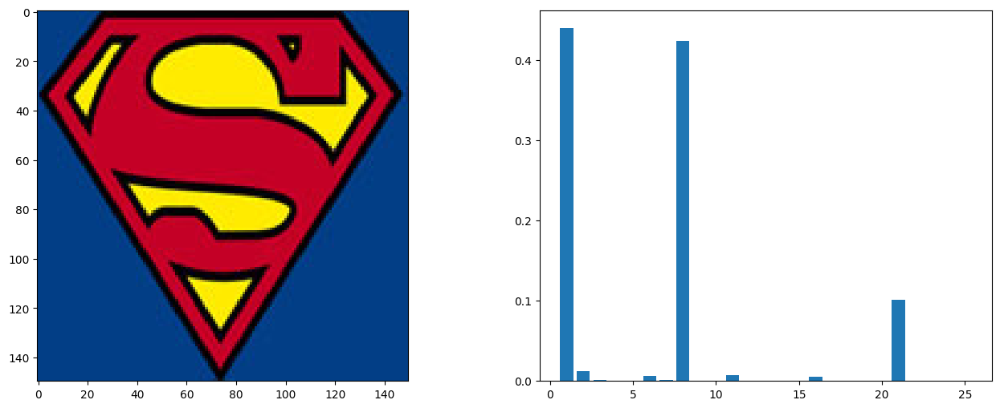

In [ ]:
# Compose and test GB histograms (histogram_module.GB_hist)
img_color = np.array(Image.open("images/superman.jpg"))

plt.figure(3, figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.imshow(img_color)

num_bins_color = 5
plt.subplot(1, 2, 2)
hist_gb = gb_hist(img_color.astype("double"), num_bins_color)
plt.bar(np.array(range(1, hist_gb.size + 1)), hist_gb)
plt.show()

##### **DX/DY Histogram**

In this exercise, you will find an implemented version of another type of histogram, the dx/dy one. However, **it is not correct, there are some mistakes in the code**:

- function `gaussdx`: **2 mistakes**;
- function `gauss_dxdy`: **2 mistakes**;
- function `hist_dxdy`: **2 mistakes**.

You are asked to copy each function in the corresponding cell and to correct the mistakes. Put a comment on the lines where you have made the corrections.
Before coding, write down the first derivative of the Gaussian function.

*HINT: leverage the result of the derivation to correct the mistakes in `gaussdx`*.

*Note: each mistaken line counts as one mistake; a mistake can also be a missing line or a missing block of lines*.

-------------------------------------------------------


**WRITE YOU ANSWER HERE**


-------------------------------------------------------

$$
\begin{align}
\frac{d}{dx}g(x) &= \frac{d}{dx}\left[\frac{1}{\sqrt{2\pi}\sigma}\exp\left(-\frac{x^2}{2\sigma^2}\right)\right] = \\
& -\frac{x}{\sigma^3\sqrt{2\pi}} \exp\left(-\frac{x^2}{2\sigma^2}\right)
\end{align}
$$

In [ ]:
def gaussdx(sigma: float) -> Tuple[np.ndarray, np.ndarray]:
    """
    This function computes the first derivative of the 1D Gaussian operator.

    Args:
        sigma (float) : the standard deviation of the Gaussian filter

    Returns:
        Dx (np.ndarray): the first derivative of the 1D Gaussian operator
        x (np.ndarray): the indexes of the 1D Gaussian operator
    """
    #####################################################
    ##              FIX THIS CODE (2 ERRORS)           ##
    #####################################################
    sigma = math.ceil(sigma)
    filter_size =2* 3 * sigma + 1 #(from -3sigma to 3sigma)

    # Generate the index x
    zero_pos = filter_size // 2    # the (zero_pos+1)th element is the 0 for the index
    x = np.arange(filter_size) - zero_pos  # indexes from -3*sigma to 3*sigma

    # Compute the Gaussian curve with std-dev sigma at the indexes x
    Dx =- x * np.exp(-(x**2) / (2.0 * sigma**2)) / (math.sqrt(2.0 * np.pi) * sigma**3) ###mistake 3: missing -ve and sigma**3 in the derivative equation

    return Dx, x

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

To check that your implementation is correct, plot the result of the function with $\sigma=3$ and compare it with the image below.

![](./images/1gaussdx.png)

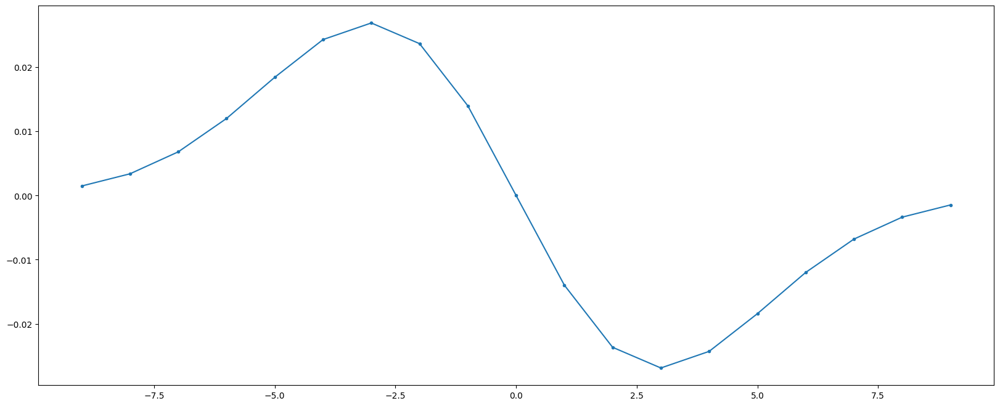

In [ ]:
# plot the first derivative of the 1D Gaussian operator
sigma = 3
Dx, x = gaussdx(sigma)
plt.figure(1)
plt.plot(x, Dx, ".-")
plt.show()

_____________________________________________________

In [ ]:
def gauss_dxdy(img: np.ndarray, sigma: float) -> Tuple[np.ndarray, np.ndarray]:
    """
    This function applies the first derivative of the 1D Gaussian operator to the image in the x and y directions.

    Args:
        img (np.ndarray): the input image.
        sigma (float): the standard deviation of the Gaussian filter.

    Returns:
        img_Dx (np.ndarray): the image after applying the first derivative of the 1D Gaussian operator in the x direction.
        img_Dy (np.ndarray): the image after applying the first derivative of the 1D Gaussian operator in the y direction.
    """
    #####################################################
    ##                 FIX THIS CODE                   ##
    #####################################################
    Gx, _ = gauss(sigma, filter_size=6*sigma+1)
    Dx, _ = gaussdx(sigma)


    # Apply separable 1D convolution to simulate 2D convolution in x and y directions
    img_Dx = convolve1d(img, Dx, axis=1)  # Derivative in x-direction
    img_Dx = convolve1d(img_Dx, Gx, axis=0)  # Gaussian smoothing in y-direction

    img_Dy = convolve1d(img, Dx, axis=0)  # Derivative in y-direction
    img_Dy = convolve1d(img_Dy, Gx, axis=1)  # Gaussian smoothing in x-direction

    return img_Dx, img_Dy

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

To check that your implementation is correct, plot the result of the function with $\sigma=1$ and compare it with the images below.

![](./images/check_gaussdxdy.png)

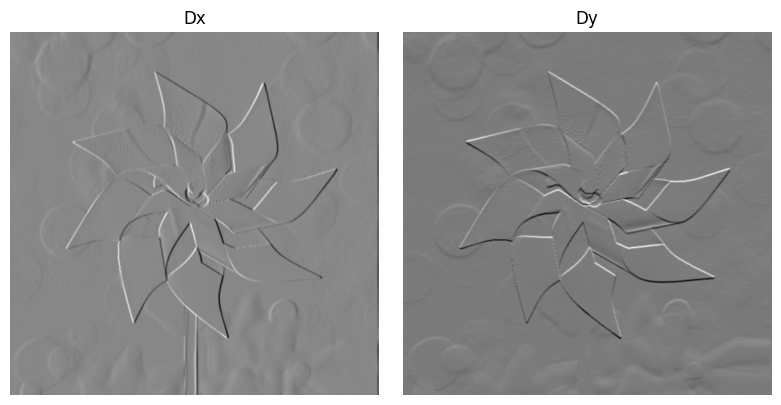

In [ ]:
img_color = rgb2gray(np.array(Image.open("images/pinwheel.jpg")))

img_Dx, img_Dy = gauss_dxdy(img_color, 1)

plot_pictures([img_Dx, img_Dy], ["Dx", "Dy"], 1, 2)

--------------------------------------------

In [ ]:
def hist_dxdy(img_gray, num_bins=5):
    """
    This function computes the *joint* histogram of Gaussian partial derivatives of the image in x and y direction.
    Set sigma to 3.0 and cap the range of derivative values is in the range [-6, 6].
    The histogram should be normalized so that the sum of all values equals 1.

    Args:
        img_gray: the input image
        num_bins: number of bins used to discretize each dimension, total number of bins in the histogram should be num_bins^2

    Returns:
        hists: the joint normalized histogram of Gaussian partial derivatives of the image in x and y direction
    """

    assert len(img_gray.shape) == 2, "image dimension mismatch"
    assert img_gray.dtype == "float", "incorrect image type"

    #####################################################
    ##                 FIX THIS CODE                   ##
    #####################################################

    # Compute the first derivatives of img_gray
    sigma = 3.0
    img_dx, img_dy = gauss_dxdy(img_gray, sigma)

    # Set the min_der and max_der to -6 and 6, which defines the ranges for quantization
    min_der, max_der = (-6, 6)

    # Flatten the 2D derivative images to 1D arrays
    img_dx = img_dx.flatten()
    img_dy = img_dy.flatten()

    # Clip the min and max values to min_der and max_der respectively
    # and shift minumum values to 0
    img_dx = np.clip(img_dx, min_der, max_der)
    img_dy = np.clip(img_dy, min_der, max_der)

    hists = np.zeros((num_bins, num_bins), dtype=int)
    bin_range = (max_der - min_der) / num_bins

    # quantize image derivative valuer into bins
    bin_dx = np.floor((img_dx- min_der) / bin_range).astype(int)
    bin_dy = np.floor((img_dy- min_der) / bin_range).astype(int)
    bin_dx = np.clip(bin_dx, 0, num_bins - 1)
    bin_dy = np.clip(bin_dy, 0, num_bins - 1)

    for i in range(bin_dx.size):
        hists[bin_dx[i], bin_dy[i]] += 1

    hists = hists / hists.sum()
    hists = hists.flatten()
    return hists

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

To check that your implementation is correct, compare it with the image below.

![](./images/check_hist_dxdy.png)

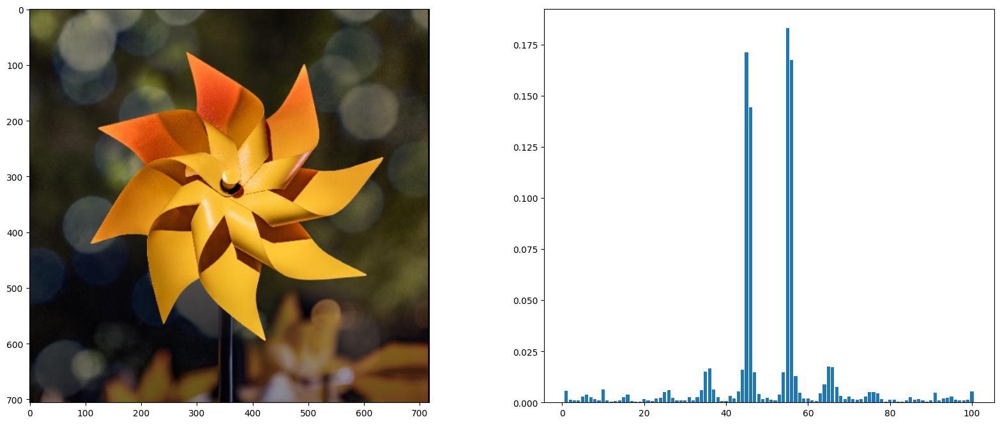

In [ ]:
img_color = np.array(Image.open("images/pinwheel.jpg"))
img_gray = rgb2gray(img_color.astype("double"))

plt.figure(5)
plt.subplot(1, 2, 1)
plt.imshow(img_color)

num_bins_dxdy = 10
plt.subplot(1, 2, 2)
hist_dxdy_ = hist_dxdy(img_gray, num_bins_dxdy)
plt.bar(np.array(range(1, hist_dxdy_.size + 1)), hist_dxdy_)
plt.show()

##### **Theoretical questions**

Now that you have implemented two color histograms - 3D joint and GB - and the dx/dy histogram, answer to the following questions:

1. What does the dx/dy histogram represent in terms of image features?
2. In your opinion, which of the two types of histograms (color and dx/dy) is more robust to changes in illumination? Why?

-------------------------------------------------------


**WRITE YOU ANSWER HERE**
1. The dx/dy histogram represents the distribution of changes in pixel intensities within an image. It captures edge and texture details by analyzing how quickly and in what direction pixel values shift.
2. The dx/dy histogram is more robust to changes in illumination than color histograms. Illumination changes often affect an image’s overall brightness and color intensities, which can alter color histograms directly. However, the dx/dy histogram, which relies on relative changes between neighboring pixels rather than absolute color values, is less affected by these variations.

-------------------------------------------------------

### **3.3: Histogram Metrics** 

Now that you have implemented and used different types of histograms, let's consider distance functions.
1. Write the definition of intersection distance function, $L_2$, and $\chi^2$ distance functions.
2. Implement each one of them.
3. Write down some considerations on each one of them.

Complete the definition of each metric.

* Intersection function **for unnormalized histograms**:

\begin{equation}
\bigcap(Q,V)= \sum_{i} \min(Q_i, V_i)
\end{equation}

This function computes the total area of overlap between two histograms, \( Q \) and \( V \).


* $L_2$ function:
\begin{equation}
d(Q,V)= \sqrt{\sum_{i} (Q_i - V_i)^2}
\end{equation}

This function computes the Euclidean distance between two histograms.


* $\chi^2$ function:
\begin{equation}
\chi^2(Q,V)= \sum_{i} \frac{(Q_i - V_i)^2}{Q_i + V_i}
\end{equation}

This function compares the distributions of two histograms and is sensitive to differences in smaller values.

Unusual metric:

* Negative Cross-Entropy function:
\begin{equation}
H(P, Q) =-\sum_{i} P_i \log(Q_i)
\end{equation}


 This function measures the difference between two probability distributions.

### Considerations for Each Metric

- **Intersection Distance**:
  - Simple and effective for measuring similarity in shape.
  - Works well for unnormalized histograms.
  - Can be affected by the scale of histograms if not normalized.

- **L2 Distance**:
  - Sensitive to large differences due to squaring of differences.
  - Good for comparing histograms of similar shapes and sizes.
  - Can be zero even if histograms are different, if they are scaled versions of each other.

- **Chi-squared Distance**:
  - More sensitive to discrepancies in smaller values of histograms.
  - Normalizes the difference by the sum of the histograms, making it robust for small values.
  - Can yield infinite values if both histograms contain zeroes.

- **Negative Cross-Entropy**:
  - Useful for comparing probability distributions.
  - Takes into account the likelihood of observing values in the first histogram when conditioned on the second.
  - Can be negatively affected by zero values, hence the addition of a small constant.


In [ ]:
def hist_intersect(h1: np.ndarray, h2: np.ndarray) -> float:
    """
    Compute the intersection between histograms x and y.
    Check that the distance range is [0,1].

    Args:
        h1 (np.ndarray): Input histogram.
        h2 (np.ndarray): Input histogram.

    Returns:
        x (float): Intersection distance between histograms x and y.
    """

    x = np.sum(np.minimum(h1, h2))

    return x


def hist_l2(h1: np.ndarray, h2: np.ndarray) -> float:
    """
    Compute the L2 between x and y histograms.
    Check that the distance range in [0,sqrt(2)].

    Args:
        h1 (np.ndarray): Input histogram.
        h2 (np.ndarray): Input histogram.

    Returns:
        x (float): L2 distance between x and y histograms.
    """

    x = np.sqrt(np.sum((h1 - h2) ** 2))

    return x


def hist_chi2(h1: np.ndarray, h2: np.ndarray) -> float:
    """
    Compute chi2 between x and y.
    Check that the distance range in [0,Inf].

    Args:
        h1 (np.ndarray): Input histogram.
        h2 (np.ndarray): Input histogram.

    Returns:
        x (float): Chi2 distance between x and y.
    """
    x = np.sum((h1 - h2) ** 2 / (h1 + h2 + 1e-10))
    return x


def hist_ce(h1: np.ndarray, h2: np.ndarray) -> float:
    """
    Compute the cross-entropy between two histograms.

    Args:
        h1 (np.ndarray): First input histogram.
        h2 (np.ndarray): Second input histogram.

    Returns:
        float: Cross-entropy between h1 and h2.
    """
    ce = -np.sum(h1 * np.log(h2 + 1e-10))
    return ce

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

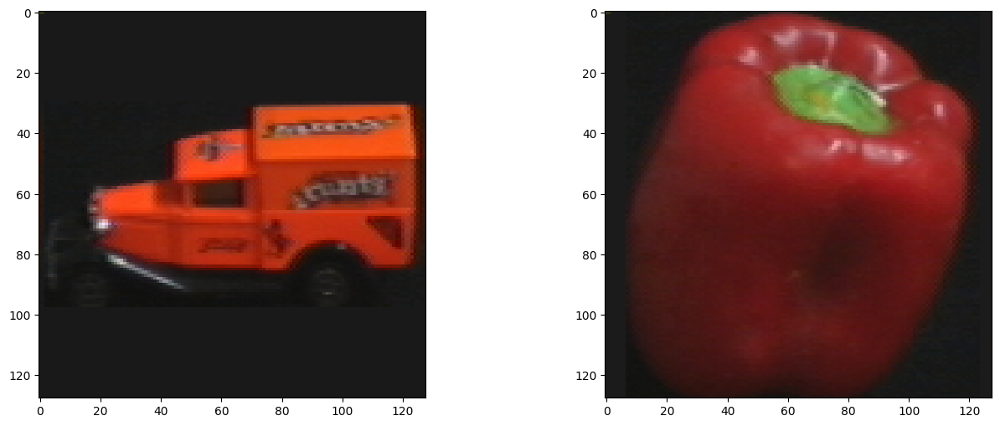

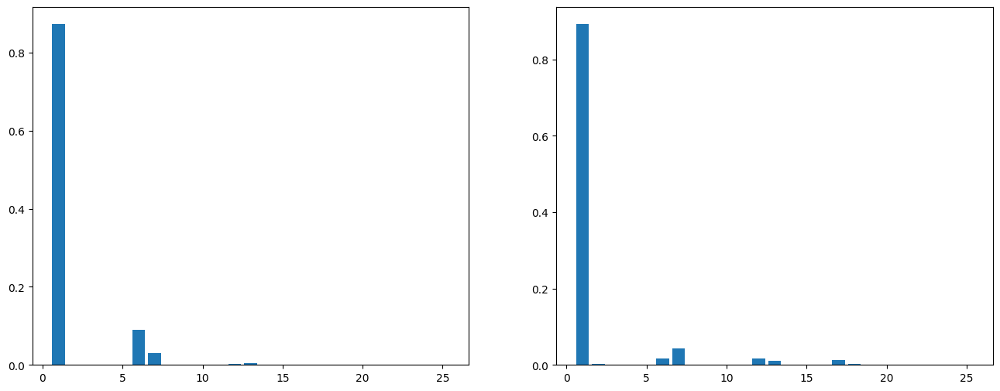

Intersection:
	0.9271240234375	0.9271240234375
L2:
	0.07900392133903596	0.07900392133903596
Chi2:
	0.08492574162120581	0.08492574162120581
CE:
	0.5983865247942034	0.5983865247942034


In [ ]:
img1 = np.array(Image.open("model/obj100__0.png"))
img2 = np.array(Image.open("model/obj63__0.png"))

num_bins_color = 5
hist1 = gb_hist(img1.astype("double"), num_bins_color)
hist2 = gb_hist(img2.astype("double"), num_bins_color)

# plot images and histograms
plt.figure(6, figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.show()

plt.figure(7, figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.bar(np.array(range(1, hist1.size + 1)), hist1)
plt.subplot(1, 2, 2)
plt.bar(np.array(range(1, hist2.size + 1)), hist2)
plt.show()

metrics = np.array(
    [hist_intersect(hist1, hist2), hist_l2(hist1, hist2), hist_chi2(hist1, hist2), hist_ce(hist1, hist2)]
)

# write distances to file
np.savetxt("assets/metrics.npy", metrics)

# read metrics from file
metrics = np.loadtxt("assets/metrics.npy")

# print distances and compare them with the solution
print(f"Intersection:\n\t{metrics[0]}\t{hist_intersect(hist1, hist2)}")
print(f"L2:\n\t{metrics[1]}\t{hist_l2(hist1, hist2)}")
print(f"Chi2:\n\t{metrics[2]}\t{hist_chi2(hist1, hist2)}")
print(f"CE:\n\t{metrics[3]}\t{hist_ce(hist1, hist2)}")

### **3.4: Image Retrieval** 

Now that you have implemented and used different types of histograms, it's time to test how suitable they are for retrieving images in a query-by-example scenario.

Implement a function called `find_best_match` that returns the closest model images for each query image.
The function takes input string parameters, identifying the distance function, histogram function, and the number of histogram bins.

*Note: See comments at the beginning of the `find_best_match` function for more details.*

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [ ]:
def is_grayvalue_hist(hist_name: str) -> bool:
    """
    Handle function to discriminate when your input
    function is in gray_scale or colors.

    Args:
        hist_name (str): histogram name.

    Returns:
        bool: True if the histogram is in gray_scale, False otherwise.
    """
    if hist_name == "grayvalue" or hist_name == "dxdy":
        return True
    elif hist_name == "rgb" or hist_name == "gb":
        return False
    else:
        assert False, "unknown histogram type"


def get_hist_by_name(img: np.ndarray, num_bins_gray: int, hist_name: str) -> np.ndarray:
    """
    Handle function to get the correct historgam function
    by his name.

    Args:
        img (np.ndarray): input image.
        num_bins_gray (int): number of bins for the gray_scale histogram.

    Returns:
        np.ndarray: histogram.
    """
    # if hist_name == "rgb":
    #     return rgb_hist(img, num_bins_gray)
    if hist_name == "gb":
        return gb_hist(img, num_bins_gray)
    elif hist_name == "dxdy":
        return hist_dxdy(img, num_bins_gray)
    else:
        assert False, "unknown hist type: %s" % hist_name


def get_dist_by_name(x: np.ndarray, y: np.ndarray, dist_name: str) -> float:
    """
    Handle function to get the correct distance function
    by his name.

    Args:
        x (np.ndarray): input histogram.
        y (np.ndarray): input histogram.

    Returns:
        float: distance.
    """
    if dist_name == "chi2":
        return hist_chi2(x, y)
    elif dist_name == "intersect":
        return 1 - hist_intersect(x, y)
    elif dist_name == "l2":
        return hist_l2(x, y)
    elif dist_name == "ce":
        return hist_ce(x, y)
    elif dist_name == "all":
        pass
    else:
        assert False, "unknown distance: %s" % dist_name


def read_files(
    model_path: str = "assets/model.txt", query_path: str = "assets/query.txt"
) -> Tuple[List[str], List[str]]:
    """
    Handle function to read query and model files.

    Args:
        model_path (str): path to the model file.
        query_path (str): path to the query file.

    Returns:
        Tuple[List[str], List[str]]: query images and model images.
    """
    with open(model_path) as fp:
        model_images = fp.readlines()
    model_images = [x.strip() for x in model_images]

    with open(query_path) as fp:
        query_images = fp.readlines()
    query_images = [x.strip() for x in query_images]

    return query_images, model_images

In [ ]:
# note: use functions 'get_dist_by_name', 'get_hist_by_name' and 'is_grayvalue_hist' to obtain
#       handles to distance and histogram functions, and to find out whether histogram function
#       expects grayvalue or color image
import cv2

def compute_histograms(
    image_list: List[np.ndarray], hist_type: str, hist_isgray: bool, num_bins: int
) -> List[np.ndarray]:
    """
    Compute the histogram for each image in image_list.

    Args:
        image_list (List[np.ndarray]): list of images.
        hist_type (str): histogram type.
        hist_isgray (bool): True if the histogram is in gray_scale, False otherwise.
        num_bins (int): number of bins for the gray_scale histogram.

    Returns:
        image_hist (List[np.ndarray]): list of histograms.
    """
    

    image_hist = []

    for img in image_list:
        if hist_isgray:
            # Convert image to grayscale if necessary
            gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            hist = get_hist_by_name(gray_img, num_bins, hist_type)
        else:
             # Compute the histogram
            hist = get_hist_by_name(img, num_bins, hist_type)

        # Append the computed histogram (an np.ndarray) to the list
        image_hist.append(hist)

    return image_hist

def find_best_match(
    model_images: List[str],
    query_images: List[str],
    dist_type: str,
    hist_type: str,
    num_bins: int,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Function to find the best match for each image in the
    query folder.

    Args:
        model_images (List[str]): list of strings with the path of model images.
        query_images (List[str]): list of strings with the path of query images.
        dist_type (str): a string to represent the name of the distance you want to use. Should be one among "l2", "intersect", "chi2".
        hist_type (str): a string to represent the name of the histogram you want to use. Should be one among "grayvalue", "rgb", "rg", "dxdy".
        num_bins (int): number of bins for the gray_scale histogram.

    Returns:
        best_match (np.ndarray): list containing in each position the index of the retrieved best matching image.
        D (np.ndarray): Matrix with |model_images| rows and |query_images| columns containing the scores of each matching.
    #"""
  

    model_imgs = [cv2.imread(img_path) for img_path in model_images]
    query_imgs = [cv2.imread(img_path) for img_path in query_images]

    hist_isgray = is_grayvalue_hist(hist_type)

    ### Compute histograms for model and query images
    model_histograms = compute_histograms(model_imgs, hist_type, hist_isgray, num_bins)
    query_histograms = compute_histograms(query_imgs, hist_type, hist_isgray, num_bins)

    D = np.zeros((len(model_images), len(query_images)))

    for qi, q_hist in enumerate(query_histograms):
        # Compare the query histogram to all model histograms
        for mi, m_hist in enumerate(model_histograms):
            D[mi, qi] = get_dist_by_name(m_hist, q_hist, dist_type)

    # For each query, find the index of the best match (smallest distance)
    best_match = np.argmin(D, axis=0)

    return best_match, D


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [ ]:
# model_images - list of file names of model images
# query_images - list of file names of query images

query_images, model_images = read_files()

dist_type = "intersect"
hist_type = "gb"
num_bins = 10

[best_match, D] = find_best_match(
    model_images, query_images, dist_type, hist_type, num_bins
)

print(
    "Indexes of correct retrieved images is:\n ",
    *np.where(best_match == np.arange(len(query_images)))
)
print(
    "The Recognition rate is",
    sum(best_match == np.arange(len(query_images))) / len(query_images),
)

Indexes of correct retrieved images is:
  [ 0  1  2  3  5  6  8  9 10 11 12 13 14 16 17 18 19 21 23 26 28 29 30 32
 33 35 37 38 39 40 42 43 44 45 46 48 49 51 52 54 55 57 58 59 60 64 66 69
 70 71 72 74 75 77 79 80 81 82 83 84 87 88]
The Recognition rate is 0.6966292134831461


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

### **Report** 

Experiment with different functions and numbers of histogram bins, and find a combination that works best. **Submit the summary of your experiments in a report as part of your solution.**


----------------------------

**Fill the table below**

----------------------------


|  | Number of Bins | Metric(Distance Metric) | Accuracy |
|---|---|---|---|
| 1 | 5 | intersect | 0.7191011235955056 |
| 2 | 7 | intersect | 0.7865168539325843 |
| 3 | 8 | intersect | 0.797752808988764 |
| 4 | 9 | intersect | 0.7303370786516854 |
| 5 | 10 | intersect | 0.6966292134831461 |
| 6 | 5 | l2 | 0.6179775280898876 |
| 7 | 7 | l2 | 0.6404494382022472 |
| 8 | 8 | l2 | 0.5842696629213483 |
| 9 | 9 | l2 | 0.5617977528089888 |
| 10 | 10 | l2 | 0.5842696629213483 |
| 12 | 11 | l2 | 0.651685393258427 |
| 13 | 5 | chi2 | 0.797752808988764 |
| 14 | 7 | chi2 | 0.8426966292134831 |
| 15 | 8 | chi2 | 0.8314606741573034 |
| 16 | 9 | chi2 | 0.8089887640449438 |
| 17 | 10 | chi2 | 0.7303370786516854 |
| ... |  |  |  |

Best Combination -> Number of Bins: 7, Metric: chi2, Accuracy: 0.8426966292134831

The chi-squared metric with 7 bins achieved the highest accuracy because it effectively highlights differences in smaller bin values during histogram comparisons. Accuracy was best with 7-8 bins, showing a good balance between capturing detail and reducing noise or overfitting. This suggests that using too few bins can miss important details, while too many can create noise or overfit the data.

## **Question 4: Performance Evaluation** 

In this question, your goal is to implement different types of metrics to evaluate the performance of a binary classificator.

For the purpose of this exercise you don't need to know the inner workings of the ML model, therefore imagine to have a black box model that estimates the probability of an event occurring, such as the sky being clear or not, based on a given dataset of independent variables. Since the outcome is a probability, the dependent variable is bounded between 0 and 1.

In order to compute a performance score (e.g., accuracy), you need to compare your predictions with the true values. So you need to convert the predicted probabilities into 0s and 1s by means of a threshold.

What you have to do is the following:
- **compute the performance** of the model with all the possible tresholds in the interval \[0.0, 1.0\] with increments of 0.5
- **analyze** how the metrics vary at different thresholds and **write a report** on your analysis

### **4.1: Performance Evaluation** 

Write the code to compute the metrics for performance evaluation, then run the provided code cell to check if your results are correct.

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [ ]:
data = pd.read_csv("./assets/ionosphere.data", header=None)
X = data[data.columns[:34]]
y = data[data.columns[-1]]
y = np.array([0 if value == "b" else 1 for value in y])
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
clf = LogisticRegression(random_state=0)
clf.fit(X_train, y_train)
y_pred = clf.predict_proba(X_test)[:, 1]

In [ ]:
import numpy as np

def my_accuracy_score(y_true: list, y_pred: list) -> float:
    """
    Compute the accuracy score.

    Args:
        y_true (list): list of true labels.
        y_pred (list): list of predicted labels.

    Returns:
        float: accuracy score.
    """
    correct_predictions = sum(t == p for t, p in zip(y_true, y_pred))
    accuracy = correct_predictions / len(y_true)
    return accuracy


def my_precision_score(y_true: list, y_pred: list) -> float:
    """
    Compute the precision score.

    Args:
        y_true (list): list of true labels.
        y_pred (list): list of predicted labels.

    Returns:
        float: precision score.
    """
    true_positive = sum((t == 1 and p == 1) for t, p in zip(y_true, y_pred))
    false_positive = sum((t == 0 and p == 1) for t, p in zip(y_true, y_pred))

    precision = true_positive / (true_positive + false_positive) if (true_positive + false_positive) != 0 else 0
    return precision


def my_recall_score(y_true: list, y_pred: list) -> float:
    """
    Compute the recall score.

    Args:
        y_true (list): list of true labels.
        y_pred (list): list of predicted labels.

    Returns:
        float: recall score.
    """
    true_positive = sum((t == 1 and p == 1) for t, p in zip(y_true, y_pred))
    false_negative = sum((t == 1 and p == 0) for t, p in zip(y_true, y_pred))

    recall = true_positive / (true_positive + false_negative) if (true_positive + false_negative) != 0 else 0
    return recall


def my_f1_score(y_true: list, y_pred: list) -> float:
    """
    Compute the f1 score.

    Args:
        y_true (list): list of true labels.
        y_pred (list): list of predicted labels.

    Returns:
        float: f1 score.
    """
    precision = my_precision_score(y_true, y_pred)
    recall = my_recall_score(y_true, y_pred)

    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) != 0 else 0
    return f1


def my_confusion_matrix(y_true: list, y_pred: list) -> np.ndarray:
    """
    Compute the confusion matrix.

    Args:
        y_true (list): list of true labels.
        y_pred (list): list of predicted labels.

    Returns:
        np.ndarray: confusion matrix.
    """
    true_positive = sum((t == 1 and p == 1) for t, p in zip(y_true, y_pred))
    true_negative = sum((t == 0 and p == 0) for t, p in zip(y_true, y_pred))
    false_positive = sum((t == 0 and p == 1) for t, p in zip(y_true, y_pred))
    false_negative = sum((t == 1 and p == 0) for t, p in zip(y_true, y_pred))

    matrix = [[true_negative, false_positive],
              [false_negative, true_positive]]

    return np.array(matrix, dtype=np.int64)


my_accuracy_score: compares the true and predicted labels to count correct predictions and divides by the total count.

 my_precision_score: counts the number of true positives and false positives and computes the ratio.

  my_recall_score: counts the number of true positives and false negatives and computes the ratio.
  
   my_f1_score: computes the F1 score using the precision and recall values.
   
   my_confusion_matrix: constructs a matrix with counts for each combination of true and predicted values.

--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [ ]:
# CHECK IF YOUR METRICS ARE CORRECT BY RUNNING THIS CODE CELL


def compare_metric(my_metric_fun, metric_fun, y_test, preds):
    try:
        if my_metric_fun.__name__ != "my_confusion_matrix":
            assert round(my_metric_fun(y_test, preds), 4) == round(
                metric_fun(y_test, preds), 4
            )
        else:
            assert np.array_equal(
                my_metric_fun(y_test, preds), metric_fun(y_test, preds)
            )
        print(f"{my_metric_fun.__name__} is correct")
    except:
        print(f"{my_metric_fun.__name__} is wrong")


preds = np.array([0 if p < 0.5 else 1 for p in y_pred])
compare_metric(my_accuracy_score, accuracy_score, y_test, preds)
compare_metric(my_precision_score, precision_score, y_test, preds)
compare_metric(my_recall_score, recall_score, y_test, preds)
compare_metric(my_f1_score, f1_score, y_test, preds)
compare_metric(my_confusion_matrix, confusion_matrix, y_test, preds)

my_accuracy_score is correct
my_precision_score is correct
my_recall_score is correct
my_f1_score is correct
my_confusion_matrix is correct


### **4.2: Closest Neighbours** 

Implement a function `show_neighbors`, which inputs a list of model images and a list of query images.
For each query image, the function has to output a visualization of 5 model images which are most similar to the query image according to the specified distance metric.

*HINT: use the function `find_best_match`.*

![](images/neighbors.png)


In [ ]:
def show_neighbors(
    model_images: List[str],
    query_images: List[str],
    dist_type: str,
    hist_type: str,
    num_bins: int,
) -> None:
    """
    For each image file from 'query_images', find and visualize the 5 nearest images from 'model_image'.
    """
    _, D = find_best_match(model_images, query_images, dist_type, hist_type, num_bins)

    for qi, query_path in enumerate(query_images):
        # Get the indices of the 5 smallest distances (most similar) for this query image
        closest_indices = np.argsort(D[:, qi])[:5]

        # Debug: Print distances to neighbors
        print(f"Query Image {qi}: Closest Distances -> {[D[model_idx, qi] for model_idx in closest_indices]}")

        # Load the query image for visualization
        query_img = cv2.imread(query_path)
        query_img_rgb = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 6, 1)
        plt.imshow(query_img_rgb)
        plt.title("Query Image")
        plt.axis("off")

        for i, model_idx in enumerate(closest_indices):
            model_img = cv2.imread(model_images[model_idx])
            model_img_rgb = cv2.cvtColor(model_img, cv2.COLOR_BGR2RGB)

            plt.subplot(1, 6, i + 2)
            plt.imshow(model_img_rgb)
            plt.title(f"Neighbor {i+1}")
            plt.axis("off")

        plt.show()


Query Image 0: Closest Distances -> [0.10546875, 0.2010498046875, 0.23065185546875, 0.2457275390625, 0.24609375]


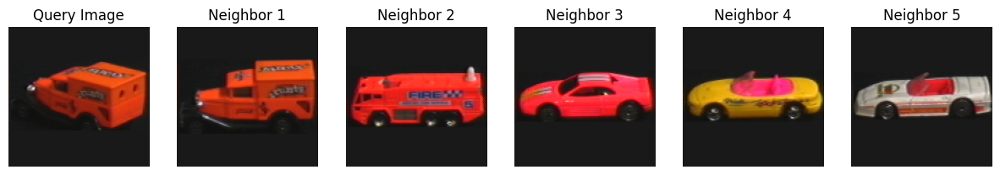

Query Image 1: Closest Distances -> [0.3565673828125, 0.37921142578125, 0.39373779296875, 0.4090576171875, 0.41357421875]


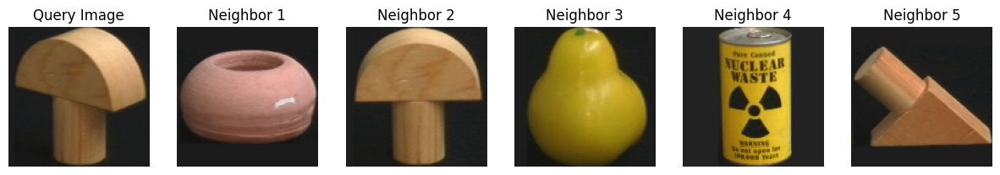

Query Image 2: Closest Distances -> [0.07501220703125, 0.22784423828125, 0.261474609375, 0.2740478515625, 0.2828369140625]


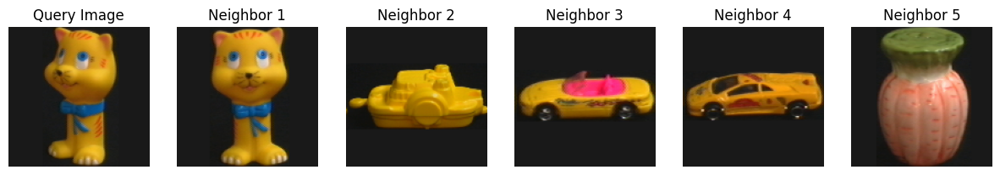

In [ ]:
## visualize nearest neighbors
query_images_vis = [query_images[i] for i in np.array([0, 4, 9])]
show_neighbors(model_images, query_images_vis, 'intersect', hist_type, num_bins)

### **4.3: Retrieval Metrics**
In previous sections, we implemented classical metrics for classification tasks. However, since we've also created a find_best_match function, we can approach this as a retrieval task. This perspective allows us to find the top-k items that best match the input item.
Given this retrieval approach, it's more appropriate to use a metric specifically designed for retrieval tasks.

**Top-k Accuracy**

This is a variation of the classical accuracy metric. Here's how it works:
1. For each input item, we consider the top k results.
2. We count the result as positive if at least one of these k results matches the correct label.

In [ ]:
def topk_accuracy(y_true: list, y_pred: np.ndarray, k: int) -> float:
    """
    Compute the Top-K accuracy, i.e., check whether the
    correct label is in the top-k results.

    Args:
        y_true (list): list of correct labels.
        y_pred (np.ndarray): A matrix of size (num_samples, num_results)
            where each cell contains the predicted score for each
            element in the dataset.
        k (int): number of best matching items to consider.

    Returns:
        topk_accuracy (float): The computed Top-K accuracy rounded to 10 decimal places.
    """
    num_samples = len(y_true)

    # Get the indices of the top-k predictions for each sample (taking smallest distances)
    top_k_indices = np.argsort(y_pred, axis=1)[:, :k]

    # Count the number of times the correct label is in the top-k predictions
    correct_in_topk = sum(y_true[i] in top_k_indices[i] for i in range(num_samples))

    # Calculate the top-k accuracy as a percentage and round it to 10 decimal places
    result = round(correct_in_topk / num_samples, 10)

    return result


--------------------------------------------
**Do not write below this line just run it**

--------------------------------------------

In [ ]:
if 'D' not in globals():
    _,D = find_best_match(
        model_images, query_images, dist_type, hist_type, num_bins
    )
y_true = np.arange(D.shape[0])

topk_accuracy(y_true, D, k=5)

0.8426966292

Now that you understand how the Top-$k$ accuracy works:
- Compute the top-k accuracy for each of the values of $k \in \{1,...,20\}$.
- Produce a plot, with the value $k$ on the x-axis and the topk-accuracy on the y-axis.
- Which is the minimum value of $k$ for which the top-$k$ accuracy is at least 80%?
- Which are the tradeoffs of incrementing $k$?


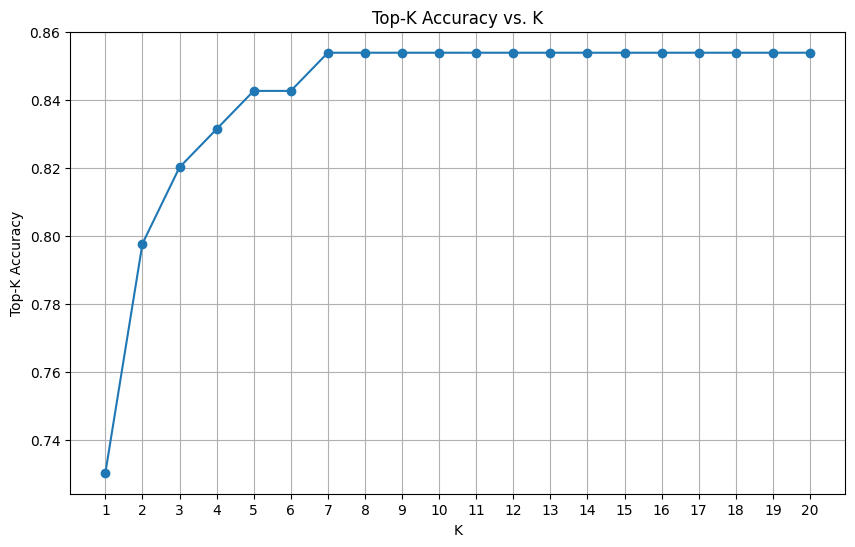

The minimum value of K for which the top-K accuracy is at least 80%: 3


In [ ]:
# Assuming D and y_true are already defined in your context
K = 20
y_true;

# List to store the top-k accuracy for k = 1 to 20
topk_accuracies = []

for k in range(1, K + 1):
    accuracy = topk_accuracy(y_true, D, k)
    topk_accuracies.append(accuracy)

# Plot the top-k accuracies
plt.figure(figsize=(10, 6))
plt.plot(range(1, K + 1), topk_accuracies, marker='o')
plt.title("Top-K Accuracy vs. K")
plt.xlabel("K")
plt.ylabel("Top-K Accuracy")
plt.xticks(np.arange(1, K + 1))
plt.grid(True)
plt.show()

# Determine the minimum value of k for which the top-K accuracy is at least 80%
min_k_for_80 = next((k for k, acc in enumerate(topk_accuracies, start=1) if acc >= 0.80), None)

print(f"The minimum value of K for which the top-K accuracy is at least 80%: {min_k_for_80}")


The minimum value of \( k \) for which the top-\( k \) accuracy is at least 80% is 3.

### Trade-offs of Incrementing \( k \):

1. **Higher Accuracy but Potential Overestimation**:
   - As \( k \) increases, the top-\( k \) accuracy generally increases, often improving the chance of the correct label appearing in the top-\( k \) predictions. However, a high \( k \) value can overestimate the model's accuracy. It may show high accuracy by including more possibilities but dilutes the precision since the model does not confidently pick a single answer.

2. **Reduced Specificity**:
   - Larger \( k \) values make the metric less specific to the actual performance of identifying the top choice correctly, as it simply checks if the true label appears within the top \( k \) options, not if it ranks highest. It’s useful when multiple outputs can be equally valuable, but it may be misleading in cases needing precise predictions.

3. **Computational Cost**:
   - Calculating top-\( k \) predictions with higher \( k \) values can increase computational cost, as the system has to sort or rank more predictions. While manageable for small \( k \), it can become resource-intensive for larger values, especially with large datasets or complex models.

4. **Interpretation and Practicality**:
   - Higher \( k \) values may be less practical or meaningful depending on the application. For instance, in recommendation systems, a top-10 list might be reasonable, but in classification tasks with a single label output, going beyond a small \( k \) (like 3-5) may not provide useful insights.

In summary, while increasing \( k \) improves the chance of correct prediction inclusion, it may reduce the interpretive value of the top-\( k \) accuracy metric by making the accuracy appear better than it is for practical decision-making.

...

### **4.4: Analysis and Report** *(1 points)*


Consider again the metrics for the classifier in Question 4.1.
Write the code to compute the metrics for all the possible tresholds in the interval (0.0, 1.0) with increments of 0.5 of `y_pred`.  
Ideally, you should put everything into a pandas DataFrame and print it for a better visualization.  
Then, write a report analyzing you your results. You have complete freedom on your analysis.

Imagine also to be in a medical scenario where your model is predicting the presence or not of a desease and try to answer to the following questions:
- What is the real life trade-off between high precision and high recall? What would you choose?
- Why isn't the accuracy an appropriate measure in such scenario?

In [ ]:
# Predict probabilities
y_pred_proba = clf.predict_proba(X_test)[:, 1]

# Initialize a list to store metrics for each threshold
metrics = []

# Calculate metrics for thresholds from 0.0 to 1.0 with a step of 0.05
thresholds = np.arange(0.0, 1.05, 0.05)
for threshold in thresholds:
    # Apply threshold to get binary predictions
    y_pred = [1 if prob >= threshold else 0 for prob in y_pred_proba]

    # Calculate metrics
    accuracy = my_accuracy_score(y_test, y_pred)
    precision = my_precision_score(y_test, y_pred)
    recall = my_recall_score(y_test, y_pred)
    f1 = my_f1_score(y_test, y_pred)
    confusion = my_confusion_matrix(y_test, y_pred)

    # Append results to metrics list
    metrics.append({
        "Threshold": threshold,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "Confusion Matrix": confusion
    })

# Convert metrics list to DataFrame for better visualization
metrics_df = pd.DataFrame(metrics)
print(metrics_df)


    Threshold  Accuracy  Precision  Recall  F1 Score     Confusion Matrix
0        0.00  0.568182   0.568182    1.00  0.724638   [[0, 38], [0, 50]]
1        0.05  0.727273   0.675676    1.00  0.806452  [[14, 24], [0, 50]]
2        0.10  0.772727   0.714286    1.00  0.833333  [[18, 20], [0, 50]]
3        0.15  0.784091   0.724638    1.00  0.840336  [[19, 19], [0, 50]]
4        0.20  0.806818   0.746269    1.00  0.854701  [[21, 17], [0, 50]]
5        0.25  0.829545   0.769231    1.00  0.869565  [[23, 15], [0, 50]]
6        0.30  0.863636   0.806452    1.00  0.892857  [[26, 12], [0, 50]]
7        0.35  0.875000   0.819672    1.00  0.900901  [[27, 11], [0, 50]]
8        0.40  0.897727   0.847458    1.00  0.917431   [[29, 9], [0, 50]]
9        0.45  0.909091   0.862069    1.00  0.925926   [[30, 8], [0, 50]]
10       0.50  0.909091   0.862069    1.00  0.925926   [[30, 8], [0, 50]]
11       0.55  0.909091   0.862069    1.00  0.925926   [[30, 8], [0, 50]]
12       0.60  0.897727   0.859649    

### Overview of Results

1. **Threshold Effect on Metrics**:
   - **Accuracy** initially increases as the threshold moves from 0 to around 0.45, stabilizing around 90% before decreasing as the threshold approaches 1.
   - **Precision** improves steadily up to a threshold of 0.90, indicating fewer false positives as the threshold for positive classification tightens.
   - **Recall** is highest at lower thresholds (0.0 to 0.5), staying at 100% up to 0.55, and begins to drop as the threshold increases, which is expected as fewer positive instances are predicted.
   - **F1 Score**, balancing precision and recall, follows an increasing trend up to around 0.5, then decreases after reaching its peak.

2. **Optimal Threshold Range**:
   - The optimal performance, particularly in F1 Score, occurs between thresholds of 0.35 and 0.55, where accuracy, precision, and recall all reach balanced high values. For instance, at thresholds of 0.45 and 0.50, the F1 Score is maximized around 0.925, with accuracy at 90.9% and recall at 100%. This suggests the classifier is balanced in both identifying positives and minimizing false positives in this range.

3. **Confusion Matrix Analysis**:
   - **Low Thresholds (0.0–0.25)**: High recall (100%) but low precision due to a high number of false positives, reflected in the upper-right corner of the confusion matrix.
   - **Medium Thresholds (0.30–0.55)**: Improved balance, with low false positives and false negatives, leading to better precision, recall, and accuracy scores.
   - **High Thresholds (0.80 and above)**: The classifier begins to miss true positives, reducing recall significantly, although precision remains high, as we see in the confusion matrices where false negatives (lower-left cell) increase.

4. **Extreme Thresholds**:
   - **Threshold = 1.0**: The model fails to predict any positive instances, resulting in zero recall, precision, and F1 score. This threshold forces all predictions to 0 (negative class), resulting in a degenerate case.
   - **Threshold = 0.0**: Every instance is predicted as positive, yielding perfect recall but poor precision, accuracy, and F1 score due to the inclusion of many false positives.

### Conclusion

The best balance across metrics is achieved in the 0.35–0.55 threshold range, with an ideal threshold around 0.45–0.50 where the F1 Score peaks. In practical applications, using a threshold in this range would allow the model to maximize its predictive power while maintaining a reasonable trade-off between precision and recall. For scenarios prioritizing recall (e.g., high sensitivity for detection), a lower threshold like 0.2–0.3 could be used. Conversely, in cases needing high precision (e.g., avoiding false positives), a threshold closer to 0.6–0.7 might be appropriate.



---



In a medical scenario where the model predicts the presence of a disease, the trade-off between high precision and high recall directly impacts patient outcomes and healthcare resources.

1. **High Precision**:
   - A model with high precision makes very few false positive predictions, meaning most people flagged as having the disease indeed have it.
   - **Real-Life Implication**: High precision minimizes unnecessary treatments and emotional stress for patients who don’t have the disease. It’s particularly valuable in cases where treatment is invasive, costly, or has significant side effects. However, this can result in some actual cases of the disease being missed if the recall is low.

2. **High Recall**:
   - A model with high recall catches most cases of the disease, meaning very few false negatives. Most people who have the disease will be flagged for further testing or treatment.
   - **Real-Life Implication**: High recall is crucial for early detection, especially in severe diseases where missing a diagnosis could lead to poor outcomes, progression of the disease, or even death. However, a model that prioritizes recall might have lower precision, resulting in more false positives, which could lead to unnecessary tests, anxiety, and increased healthcare costs.

### What to Choose?
In a medical scenario, the choice between prioritizing precision or recall depends on the specific disease and the consequences of false positives and false negatives:

- **For Life-Threatening or Severe Diseases** (e.g., cancer, heart disease): High recall is generally preferred because missing a case can have serious or fatal consequences. The healthcare system would rather err on the side of caution, accepting some false positives to ensure that almost all actual cases are detected.

- **For Less Severe or Easily Treatable Conditions**: High precision might be more desirable to avoid the cost, stress, and potential side effects of unnecessary treatments. For example, in cases of minor skin conditions, prioritizing precision can help avoid over-treatment.

### Conclusion
In critical medical scenarios, high recall is often prioritized because the cost of missing a true case is much higher than the cost of a false alarm. However, in an ideal scenario, balancing recall and precision is best to maximize the benefits of early detection while minimizing unnecessary interventions.



---

Accuracy is not an appropriate measure in medical diagnosis scenarios because it does not account for the imbalance between false positives and false negatives, which can have vastly different real-world implications in a medical context.

In medical settings, **disease prevalence** is often low—meaning the number of patients with the disease (positives) is much smaller than those without it (negatives). This imbalance skews accuracy as a metric because a model can achieve high accuracy simply by predicting the majority class (e.g., "no disease") for most patients, even if it misses most cases of the disease. For instance, in a population where only 5% have a particular disease, a model that predicts "no disease" for everyone will have 95% accuracy, despite failing to detect any actual cases.

### Why Accuracy Falls Short in Medical Diagnosis
1. **False Negatives (Missed Diagnoses)**: In a medical scenario, failing to detect a disease can have serious, life-threatening consequences. However, accuracy does not reflect this risk since it treats false negatives the same as false positives.

2. **False Positives (Unnecessary Alarms)**: Accuracy does not differentiate between false positives and true negatives, which can lead to overlooking the psychological, financial, and medical costs of unnecessary follow-up tests and treatments.

3. **Class Imbalance**: Because diseases are often rare, accuracy can be misleadingly high in imbalanced datasets, ignoring the model's actual performance in detecting the minority class (patients with the disease).

### More Appropriate Metrics
Metrics like **precision** and **recall** (or sensitivity) are more informative because they highlight how well the model performs in identifying true cases:
- **Recall** emphasizes the model’s ability to detect all cases of disease, minimizing false negatives.
- **Precision** indicates the model’s effectiveness in ensuring that positive predictions are correct, minimizing false positives.

In most medical contexts, a high recall rate is prioritized, often complemented by a reasonable level of precision, as this combination ensures that true cases are detected while managing the rate of unnecessary treatments.